# Importing libraries

In [1]:
from IPython.display import Image, display

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

from sklearn import metrics
from wordcloud import WordCloud
import warnings
warnings.filterwarnings("ignore")
plt.style.use('bmh')

# Importing dataset

In [2]:
data=pd.read_csv('googleplaystore.csv')

# Basic Data Exploration(Understanding the Dataset)

In [3]:
data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [4]:
data.sample(5)

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
7014,SegPlay Mobile Paint by Number,FAMILY,3.7,1478,43M,"100,000+",Free,0,Everyone,Casual,"April 22, 2017",4.0.15,2.3 and up
5604,PS4 Second Screen,FAMILY,2.4,11773,3.3M,"1,000,000+",Free,0,Everyone,Entertainment,"June 13, 2018",18.6.2,4.1 and up
1720,Bowmasters,GAME,4.7,1534466,Varies with device,"50,000,000+",Free,0,Teen,Action,"July 23, 2018",2.12.5,4.1 and up
7773,Ultimate Calculator for CR,PRODUCTIVITY,3.7,7389,41M,"500,000+",Free,0,Everyone,Productivity,"March 15, 2017",1.0.4,4.0 and up
10147,EZ App Installer,TOOLS,4.1,533,1.4M,"100,000+",Free,0,Everyone,Tools,"July 22, 2017",1.4.13,4.0 and up


In [5]:
data.shape

(10841, 13)

In [6]:
data.columns

Index(['App', 'Category', 'Rating', 'Reviews', 'Size', 'Installs', 'Type',
       'Price', 'Content Rating', 'Genres', 'Last Updated', 'Current Ver',
       'Android Ver'],
      dtype='object')

In [7]:
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
App,10841,9660,ROBLOX,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Category,10841,34,FAMILY,1972,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rating,9367.0,NaN,NaN,NaN,4.193338,0.537431,1.0,4.0,4.3,4.5,19.0
Reviews,10841,6002,0,596,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Size,10841,462,Varies with device,1695,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Installs,10841,22,"1,000,000+",1579,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,10840,3,Free,10039,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Price,10841,93,0,10040,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Content Rating,10840,6,Everyone,8714,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Genres,10841,120,Tools,842,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
data.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10841 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10841 non-null  object 
 1   Category        10841 non-null  object 
 2   Rating          9367 non-null   float64
 3   Reviews         10841 non-null  object 
 4   Size            10841 non-null  object 
 5   Installs        10841 non-null  object 
 6   Type            10840 non-null  object 
 7   Price           10841 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10841 non-null  object 
 10  Last Updated    10841 non-null  object 
 11  Current Ver     10833 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), object(12)
memory usage: 1.1+ MB


* The data has 12 object and 1 numeric feature

#### we need to convert [`Reviews` & `Size`  &  `Installs` & `Price`] to int
* [Reviews](#11.0)
* [Size](#12.0)
* [Installs](#13.0) &  [Price](#14.0)

#### we need to Change Last update into a datetime column



* [Reviews](#1.0)


# Checking if all values in number of Reviews numeric


In [9]:
data[~data.Reviews.str.isnumeric()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
10472,Life Made WI-Fi Touchscreen Photo Frame,1.9,19.0,3.0M,"1,000+",Free,0,Everyone,NaN,"February 11, 2018",1.0.19,4.0 and up,NaN


In [10]:
data=data.drop(data.index[10472])

In [11]:
data["Reviews"] = data["Reviews"].astype(int)

In [12]:
data.info()  

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            10840 non-null  object 
 5   Installs        10840 non-null  object 
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(1), int32(1), object(11)
memory usage: 1.1+ MB


* It can be seen that data has metric prefixes (Kilo and Mega) along with another string. Replacing k and M with their values to convert values to numeric.

In [13]:
data['Size'].unique()

array(['19M', '14M', '8.7M', '25M', '2.8M', '5.6M', '29M', '33M', '3.1M',
       '28M', '12M', '20M', '21M', '37M', '2.7M', '5.5M', '17M', '39M',
       '31M', '4.2M', '7.0M', '23M', '6.0M', '6.1M', '4.6M', '9.2M',
       '5.2M', '11M', '24M', 'Varies with device', '9.4M', '15M', '10M',
       '1.2M', '26M', '8.0M', '7.9M', '56M', '57M', '35M', '54M', '201k',
       '3.6M', '5.7M', '8.6M', '2.4M', '27M', '2.5M', '16M', '3.4M',
       '8.9M', '3.9M', '2.9M', '38M', '32M', '5.4M', '18M', '1.1M',
       '2.2M', '4.5M', '9.8M', '52M', '9.0M', '6.7M', '30M', '2.6M',
       '7.1M', '3.7M', '22M', '7.4M', '6.4M', '3.2M', '8.2M', '9.9M',
       '4.9M', '9.5M', '5.0M', '5.9M', '13M', '73M', '6.8M', '3.5M',
       '4.0M', '2.3M', '7.2M', '2.1M', '42M', '7.3M', '9.1M', '55M',
       '23k', '6.5M', '1.5M', '7.5M', '51M', '41M', '48M', '8.5M', '46M',
       '8.3M', '4.3M', '4.7M', '3.3M', '40M', '7.8M', '8.8M', '6.6M',
       '5.1M', '61M', '66M', '79k', '8.4M', '118k', '44M', '695k', '1.6M',
     

* Remove all characters from size and convert it to float

In [14]:
def convert_size(size):
    if 'M' in size:
        x=size[:-1]
        x=float(x)*1000
        return(x)
    elif 'k'==size[:-1]:
        x=size[:-1]
        x=float(x)
        return(x)
    else:
        return None

In [15]:
data["Size"]=data["Size"].map(convert_size)

In [16]:
data.Size.unique()

array([ 19000.,  14000.,   8700.,  25000.,   2800.,   5600.,  29000.,
        33000.,   3100.,  28000.,  12000.,  20000.,  21000.,  37000.,
         2700.,   5500.,  17000.,  39000.,  31000.,   4200.,   7000.,
        23000.,   6000.,   6100.,   4600.,   9200.,   5200.,  11000.,
        24000.,     nan,   9400.,  15000.,  10000.,   1200.,  26000.,
         8000.,   7900.,  56000.,  57000.,  35000.,  54000.,   3600.,
         5700.,   8600.,   2400.,  27000.,   2500.,  16000.,   3400.,
         8900.,   3900.,   2900.,  38000.,  32000.,   5400.,  18000.,
         1100.,   2200.,   4500.,   9800.,  52000.,   9000.,   6700.,
        30000.,   2600.,   7100.,   3700.,  22000.,   7400.,   6400.,
         3200.,   8200.,   9900.,   4900.,   9500.,   5000.,   5900.,
        13000.,  73000.,   6800.,   3500.,   4000.,   2300.,   7200.,
         2100.,  42000.,   7300.,   9100.,  55000.,   6500.,   1500.,
         7500.,  51000.,  41000.,  48000.,   8500.,  46000.,   8300.,
         4300.,   47

In [17]:
###### Convert mega to kilo then convert all to mega
for i in data['Size']:
    if i < 10:
        data['Size']=data['Size'].replace(i,i*1000)
data['Size']=data['Size']/1000
data['Size']

0        19.0
1        14.0
2         8.7
3        25.0
4         2.8
         ... 
10836    53.0
10837     3.6
10838     9.5
10839     NaN
10840    19.0
Name: Size, Length: 10840, dtype: float64

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  object 
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  object 
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(2), int32(1), object(10)
memory usage: 1.1+ MB


* Installs &  Price


In [19]:
data['Installs'].unique()

array(['10,000+', '500,000+', '5,000,000+', '50,000,000+', '100,000+',
       '50,000+', '1,000,000+', '10,000,000+', '5,000+', '100,000,000+',
       '1,000,000,000+', '1,000+', '500,000,000+', '50+', '100+', '500+',
       '10+', '1+', '5+', '0+', '0'], dtype=object)

In [20]:
data['Price'].unique()

array(['0', '$4.99', '$3.99', '$6.99', '$1.49', '$2.99', '$7.99', '$5.99',
       '$3.49', '$1.99', '$9.99', '$7.49', '$0.99', '$9.00', '$5.49',
       '$10.00', '$24.99', '$11.99', '$79.99', '$16.99', '$14.99',
       '$1.00', '$29.99', '$12.99', '$2.49', '$10.99', '$1.50', '$19.99',
       '$15.99', '$33.99', '$74.99', '$39.99', '$3.95', '$4.49', '$1.70',
       '$8.99', '$2.00', '$3.88', '$25.99', '$399.99', '$17.99',
       '$400.00', '$3.02', '$1.76', '$4.84', '$4.77', '$1.61', '$2.50',
       '$1.59', '$6.49', '$1.29', '$5.00', '$13.99', '$299.99', '$379.99',
       '$37.99', '$18.99', '$389.99', '$19.90', '$8.49', '$1.75',
       '$14.00', '$4.85', '$46.99', '$109.99', '$154.99', '$3.08',
       '$2.59', '$4.80', '$1.96', '$19.40', '$3.90', '$4.59', '$15.46',
       '$3.04', '$4.29', '$2.60', '$3.28', '$4.60', '$28.99', '$2.95',
       '$2.90', '$1.97', '$200.00', '$89.99', '$2.56', '$30.99', '$3.61',
       '$394.99', '$1.26', '$1.20', '$1.04'], dtype=object)

In [21]:
items_to_remove=['+',',','$']
cols_to_clean=['Installs','Price']
for item in items_to_remove:
    for col in cols_to_clean:
        data[col]=data[col].str.replace(item,'')
data.head()

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.1,159,19.0,10000,Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.9,967,14.0,500000,Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.7,87510,8.7,5000000,Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.5,215644,25.0,50000000,Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.3,967,2.8,100000,Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up


In [22]:
data.Installs.unique()

array(['10000', '500000', '5000000', '50000000', '100000', '50000',
       '1000000', '10000000', '5000', '100000000', '1000000000', '1000',
       '500000000', '50', '100', '500', '10', '1', '5', '0'], dtype=object)

In [23]:
data['Price'].unique()

array(['0', '4.99', '3.99', '6.99', '1.49', '2.99', '7.99', '5.99',
       '3.49', '1.99', '9.99', '7.49', '0.99', '9.00', '5.49', '10.00',
       '24.99', '11.99', '79.99', '16.99', '14.99', '1.00', '29.99',
       '12.99', '2.49', '10.99', '1.50', '19.99', '15.99', '33.99',
       '74.99', '39.99', '3.95', '4.49', '1.70', '8.99', '2.00', '3.88',
       '25.99', '399.99', '17.99', '400.00', '3.02', '1.76', '4.84',
       '4.77', '1.61', '2.50', '1.59', '6.49', '1.29', '5.00', '13.99',
       '299.99', '379.99', '37.99', '18.99', '389.99', '19.90', '8.49',
       '1.75', '14.00', '4.85', '46.99', '109.99', '154.99', '3.08',
       '2.59', '4.80', '1.96', '19.40', '3.90', '4.59', '15.46', '3.04',
       '4.29', '2.60', '3.28', '4.60', '28.99', '2.95', '2.90', '1.97',
       '200.00', '89.99', '2.56', '30.99', '3.61', '394.99', '1.26',
       '1.20', '1.04'], dtype=object)

In [24]:
data['Installs']=data['Installs'].astype('int')
data['Price']=data['Price'].astype('float')
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  int32  
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  float64
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Last Updated    10840 non-null  object 
 11  Current Ver     10832 non-null  object 
 12  Android Ver     10838 non-null  object 
dtypes: float64(3), int32(2), object(8)
memory usage: 1.1+ MB


* last updated

In [25]:
data['Last Updated'] = pd.to_datetime(data['Last Updated'])
data['Last Updated']

0       2018-01-07
1       2018-01-15
2       2018-08-01
3       2018-06-08
4       2018-06-20
           ...    
10836   2017-07-25
10837   2018-07-06
10838   2017-01-20
10839   2015-01-19
10840   2018-07-25
Name: Last Updated, Length: 10840, dtype: datetime64[ns]

In [26]:
data['Updated_Day']=data['Last Updated'].dt.day
data['Updated_Month']=data['Last Updated'].dt.month
data['Updated_Year']=data['Last Updated'].dt.year

In [27]:
data['new'] = data['Last Updated']
data['lastupdate'] = (data['new'] - data['new'].max()).dt.days

In [28]:
data.drop(['Last Updated', 'new'] ,axis=1, inplace=True)

In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10840 entries, 0 to 10840
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             10840 non-null  object 
 1   Category        10840 non-null  object 
 2   Rating          9366 non-null   float64
 3   Reviews         10840 non-null  int32  
 4   Size            8829 non-null   float64
 5   Installs        10840 non-null  int32  
 6   Type            10839 non-null  object 
 7   Price           10840 non-null  float64
 8   Content Rating  10840 non-null  object 
 9   Genres          10840 non-null  object 
 10  Current Ver     10832 non-null  object 
 11  Android Ver     10838 non-null  object 
 12  Updated_Day     10840 non-null  int64  
 13  Updated_Month   10840 non-null  int64  
 14  Updated_Year    10840 non-null  int64  
 15  lastupdate      10840 non-null  int64  
dtypes: float64(3), int32(2), int64(4), object(7)
memory usage: 1.3+ MB


# Data Cleaning

## Checking for null values


In [30]:
Null_data = data.isna().sum().sort_values(ascending=False)
null = pd.DataFrame(
    {'Null Values' : Null_data
     ,'Percentage Null Values' : Null_data / (data.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
Size,2011,18.551661
Rating,1474,13.597786
Current Ver,8,0.073801
Android Ver,2,0.018450
Type,1,0.009225
App,0,0.000000
Category,0,0.000000
Reviews,0,0.000000
Installs,0,0.000000
Price,0,0.000000


<BarContainer object of 16 artists>

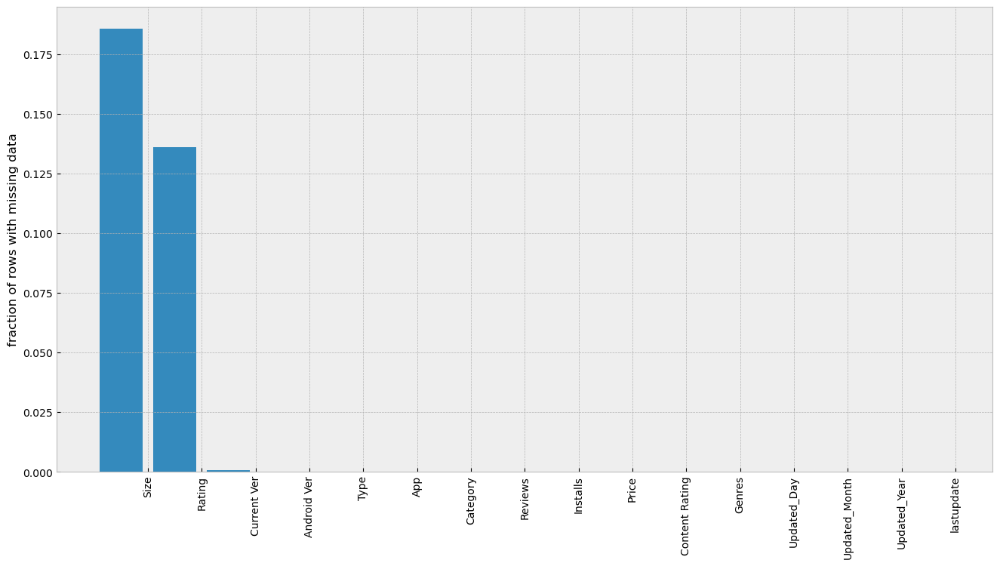

In [31]:
null_counts = Null_data /len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts))+0.5,
           null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

In [32]:
### lets create a function so that I can easily do it for all features
def Random_value_imputation(feature):
    random_sample=data[feature].dropna().sample(data[feature].isnull().sum())               
    random_sample.index=data[data[feature].isnull()].index
    data.loc[data[feature].isnull(),feature]=random_sample

In [33]:
for col in data:
    Random_value_imputation(col)

In [34]:
Null_data = data.isna().sum().sort_values(ascending=False)
null = pd.DataFrame(
    {'Null Values' : Null_data
     ,'Percentage Null Values' : Null_data / (data.shape[0]) * (100)})
null

,Null Values,Percentage Null Values
App,0,0.0
Category,0,0.0
Rating,0,0.0
Reviews,0,0.0
Size,0,0.0
Installs,0,0.0
Type,0,0.0
Price,0,0.0
Content Rating,0,0.0
Genres,0,0.0


<BarContainer object of 16 artists>

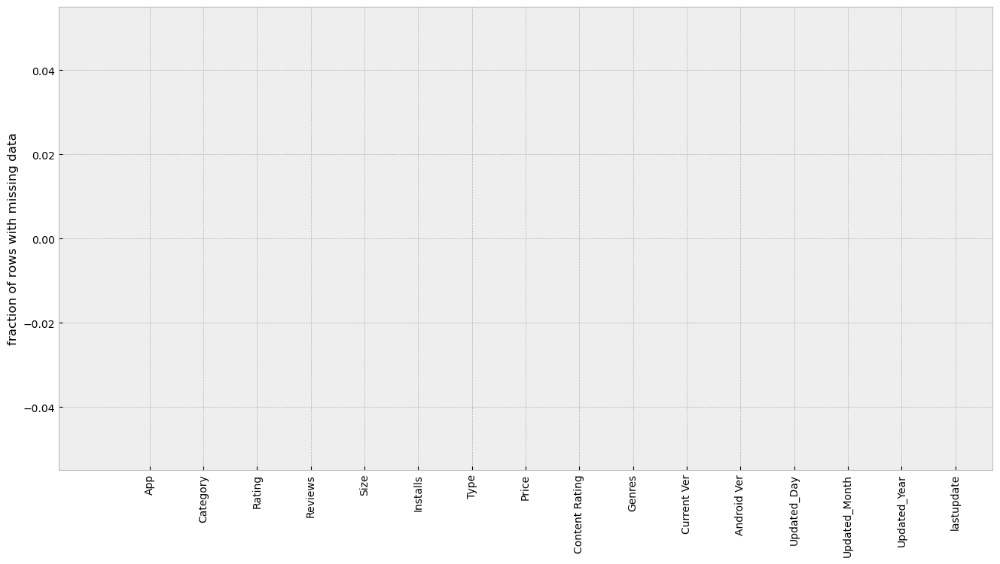

In [35]:
null_counts = Null_data /len(data)
plt.figure(figsize=(16,8))
plt.xticks(np.arange(len(null_counts))+0.5,
           null_counts.index,rotation='vertical')
plt.ylabel('fraction of rows with missing data')
plt.bar(np.arange(len(null_counts)),null_counts)

## Delete data duplicated

In [36]:
duplicate = data.duplicated()
print(duplicate.sum())

306


In [37]:
data.drop_duplicates(inplace=True)

In [38]:
duplicate = data.duplicated()
print(duplicate.sum())

0


## Extract Numerical & Categorical Features

In [39]:
num_features=[col for col in data.columns if data[col].dtype!='O']
num_features

['Rating',
 'Reviews',
 'Size',
 'Installs',
 'Price',
 'Updated_Day',
 'Updated_Month',
 'Updated_Year',
 'lastupdate']

In [40]:
num_data = data[num_features]
num_data.head()

,Rating,Reviews,Size,Installs,Price,Updated_Day,Updated_Month,Updated_Year,lastupdate
0,4.1,159,19.0,10000,0.0,7,1,2018,-213
1,3.9,967,14.0,500000,0.0,15,1,2018,-205
2,4.7,87510,8.7,5000000,0.0,1,8,2018,-7
3,4.5,215644,25.0,50000000,0.0,8,6,2018,-61
4,4.3,967,2.8,100000,0.0,20,6,2018,-49


In [41]:
cat_features=[col for col in data.columns if data[col].dtype=='O']
cat_features

['App',
 'Category',
 'Type',
 'Content Rating',
 'Genres',
 'Current Ver',
 'Android Ver']

In [42]:
categorical=data[cat_features]
categorical.head()

,App,Category,Type,Content Rating,Genres,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,Free,Everyone,Art & Design,1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,Free,Everyone,Art & Design;Pretend Play,2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,Free,Everyone,Art & Design,1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,Free,Teen,Art & Design,Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,Free,Everyone,Art & Design;Creativity,1.1,4.4 and up


## Check outliers

In [43]:
def outlier_thresholds(dataframe, variable):
    quartile1 = dataframe[variable].quantile(0.10)
    quartile3 = dataframe[variable].quantile(0.90)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit

In [44]:
def has_outliers(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    if dataframe[(dataframe[variable] < low_limit) | (dataframe[variable] > up_limit)].any(axis=None):
        print(variable, "yes")
    else:
        print(variable, "no")

In [45]:
for col in num_data.columns:
    has_outliers(num_data, col)

Rating yes
Reviews yes
Size no
Installs yes
Price yes
Updated_Day no
Updated_Month no
Updated_Year yes
lastupdate yes


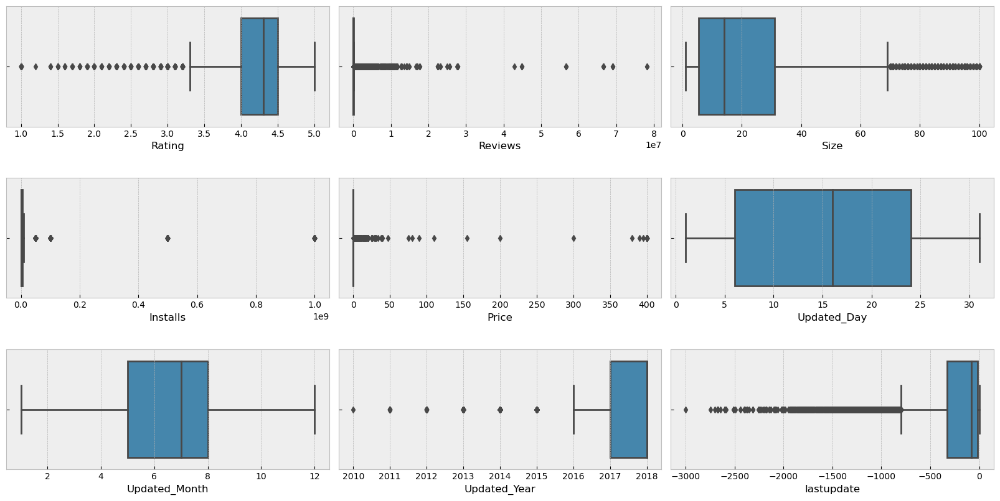

In [46]:
fig, axs = plt.subplots(ncols=3, nrows=3, figsize=(16, 8))
index = 0
axs = axs.flatten()
for i,col in enumerate(num_data.columns):
    sns.boxplot(x = num_data[col], ax = axs[i])
plt.tight_layout(pad= 0.5, w_pad=0.5, h_pad=3.0)

In [47]:
## function to get ride of qutliers
def replace_with_thresholds(dataframe, numeric_columns):
    for variable in numeric_columns:
        low_limit, up_limit = outlier_thresholds(dataframe, variable)
        dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
        dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [48]:
replace_with_thresholds(num_data, num_data.columns)

In [49]:
for col in num_data.columns:
    has_outliers(num_data, col)

Rating no
Reviews no
Size no
Installs no
Price no
Updated_Day no
Updated_Month no
Updated_Year no
lastupdate no


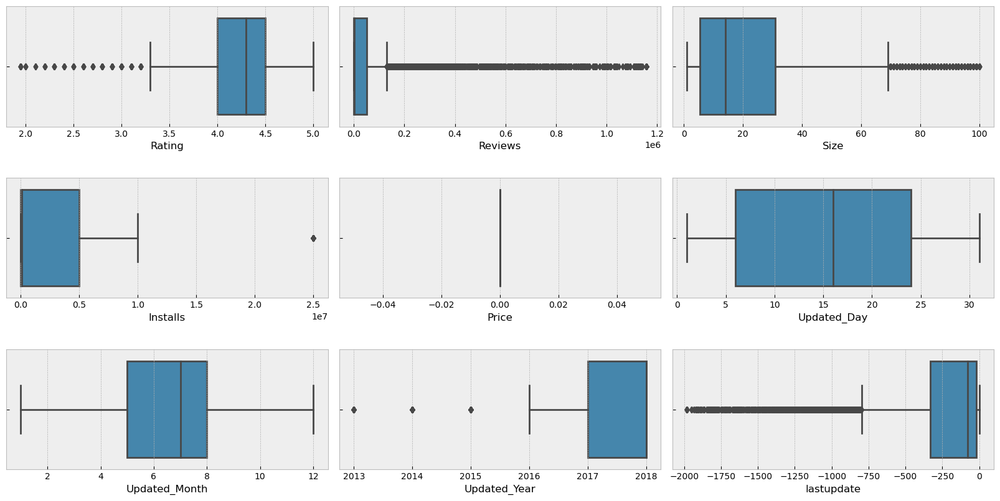

In [50]:
fig, axs = plt.subplots(ncols=3, nrows=3, figsize=(16, 8))
index = 0
axs = axs.flatten()
for i,col in enumerate(num_data.columns):
    sns.boxplot(x = num_data[col], ax = axs[i])
plt.tight_layout(pad= 0.5, w_pad=0.5, h_pad=3.0)

In [51]:
for col in data[num_features]:
    has_outliers(data, col)

Rating yes
Reviews yes
Size no
Installs yes
Price yes
Updated_Day no
Updated_Month no
Updated_Year yes
lastupdate yes


In [52]:
data_clean = data.copy()

In [53]:
replace_with_thresholds(data_clean, num_features)

In [54]:
for col in data_clean[num_features]:
    has_outliers(data_clean, col)

Rating no
Reviews no
Size no
Installs no
Price no
Updated_Day no
Updated_Month no
Updated_Year no
lastupdate no


# Exploratory Data Analysis (EDA)

## Category Column

In [55]:
categorical['Category'].value_counts()

FAMILY                 1946
GAME                   1129
TOOLS                   843
BUSINESS                439
PRODUCTIVITY            420
MEDICAL                 417
PERSONALIZATION         391
COMMUNICATION           382
LIFESTYLE               375
SPORTS                  368
FINANCE                 363
PHOTOGRAPHY             324
HEALTH_AND_FITNESS      317
SOCIAL                  288
NEWS_AND_MAGAZINES      276
TRAVEL_AND_LOCAL        245
SHOPPING                240
BOOKS_AND_REFERENCE     230
DATING                  202
VIDEO_PLAYERS           175
EDUCATION               141
MAPS_AND_NAVIGATION     137
FOOD_AND_DRINK          125
ENTERTAINMENT           125
AUTO_AND_VEHICLES        85
LIBRARIES_AND_DEMO       85
HOUSE_AND_HOME           82
WEATHER                  82
ART_AND_DESIGN           65
EVENTS                   64
PARENTING                60
COMICS                   60
BEAUTY                   53
Name: Category, dtype: int64

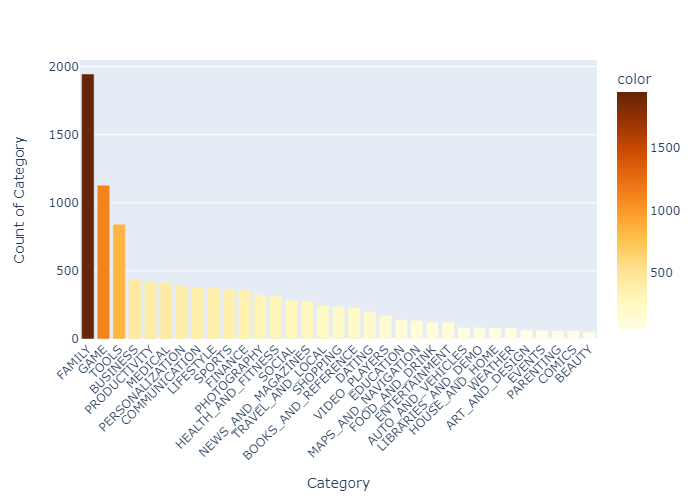

In [56]:
bar = px.bar(
        x = categorical['Category'].value_counts().index, # index = category name
        y = categorical['Category'].value_counts().values,
        color=categorical['Category'].value_counts().values,
        color_continuous_scale='YlOrBr'
)
bar.update_layout(xaxis_title='Category', yaxis_title='Count of Category')
bar.update_xaxes(tickangle= -45)
bar.show()
bar.write_image("Count of Category.png")
display(Image(filename='Count of Category.png'))

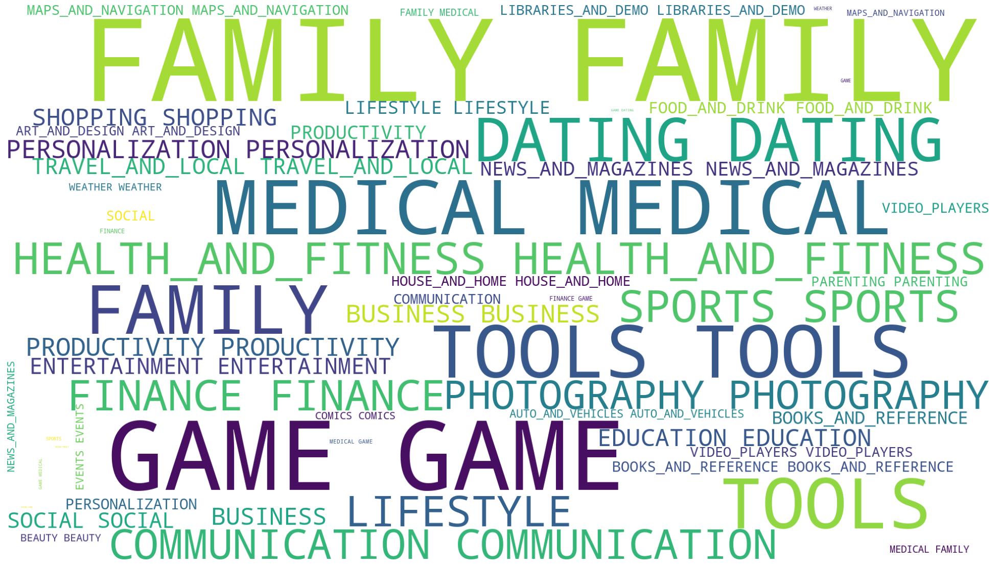

In [57]:
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(data.Category))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [58]:
# Group apps by category and then sum the number of installations
category_installs = data.groupby('Category').agg({'Installs': pd.Series.sum})
category_installs.sort_values('Installs', ascending=True, inplace=True)
category_installs

,Installs
Category,
EVENTS,15973161
BEAUTY,27197050
PARENTING,31521110
MEDICAL,42234537
AUTO_AND_VEHICLES,53130211
COMICS,56086150
LIBRARIES_AND_DEMO,62995910
ART_AND_DESIGN,124338100
HOUSE_AND_HOME,145212461


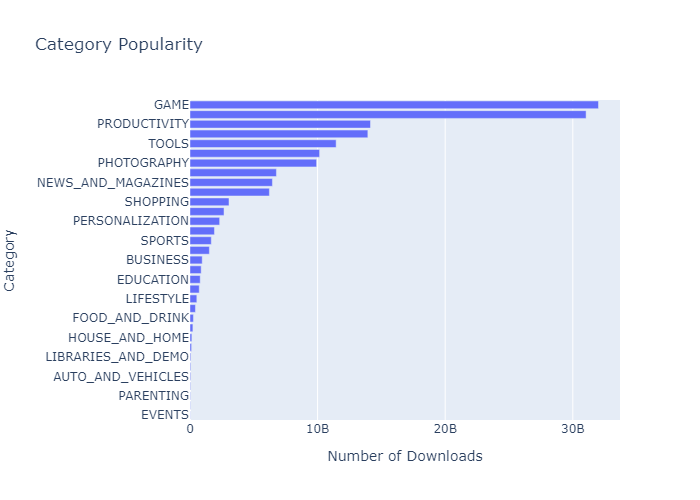

In [59]:
h_bar = px.bar(
        x = category_installs.Installs,
        y = category_installs.index,
        orientation='h',
        title='Category Popularity')

h_bar.update_layout(xaxis_title='Number of Downloads', yaxis_title='Category')
h_bar.show()

h_bar.write_image("Category_Popularity.png")
display(Image(filename='Category_Popularity.png'))

In [60]:
# Count the number of apps in each category
cat_number = data.groupby('Category').agg({'App': pd.Series.count})
cat_merged_df = pd.merge(cat_number, category_installs, on='Category', how="inner")
print(f'The dimensions of the DataFrame are: {cat_merged_df.shape}')
cat_merged_df.sort_values('Installs', ascending=False)

The dimensions of the DataFrame are: (33, 2)


,App,Installs
Category,,
GAME,1129,32014024415
COMMUNICATION,382,31042276251
PRODUCTIVITY,420,14145091369
SOCIAL,288,13938867902
TOOLS,843,11452771915
FAMILY,1946,10156692505
PHOTOGRAPHY,324,9921247655
TRAVEL_AND_LOCAL,245,6772887146
NEWS_AND_MAGAZINES,276,6459317760


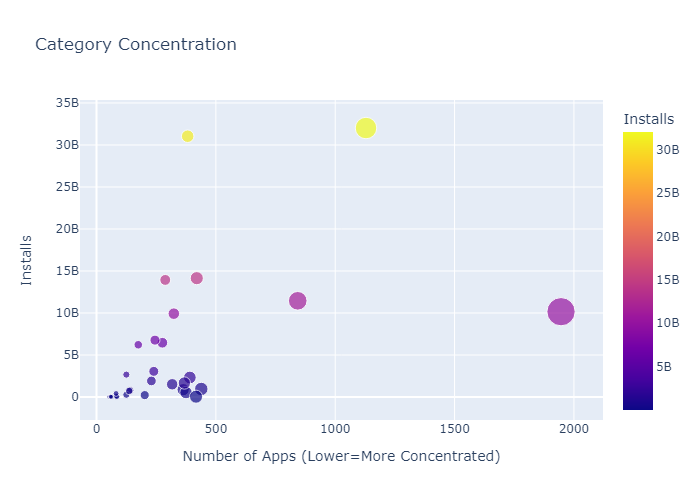

In [61]:
scatter = px.scatter(cat_merged_df, # data
                     x='App', # column name
                     y='Installs',
                     title='Category Concentration',
                     size='App',
                     hover_name=cat_merged_df.index,
                     color='Installs') 

scatter.update_layout(xaxis_title="Number of Apps (Lower=More Concentrated)",
                      yaxis_title="Installs",
                      #yaxis=dict(type='log')
                     )

scatter.show()

scatter.write_image("Category_Concentration_1.png")
display(Image(filename='Category_Concentration_1.png'))

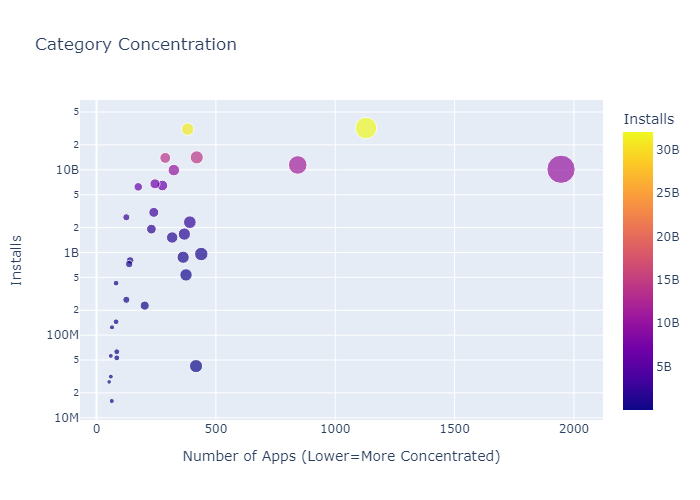

In [62]:
scatter = px.scatter(cat_merged_df, # data
                     x='App', # column name
                     y='Installs',
                     title='Category Concentration',
                     size='App',
                     hover_name=cat_merged_df.index,
                     color='Installs'
) 

scatter.update_layout(xaxis_title="Number of Apps (Lower=More Concentrated)",
                      yaxis_title="Installs",
                      yaxis=dict(type='log'))

scatter.show()

scatter.write_image("Category_Concentration_2.png")
display(Image(filename='Category_Concentration_2.png'))

In [63]:
df_free_vs_paid = data.groupby(["Category", "Type"], 
                                      as_index=False).agg({'App': pd.Series.count})
df_free_vs_paid.sort_values('App')

,Category,Type,App
19,EVENTS,Paid,1
32,LIBRARIES_AND_DEMO,Paid,1
25,FOOD_AND_DRINK,Paid,2
40,NEWS_AND_MAGAZINES,Paid,2
42,PARENTING,Paid,2
...,...,...,...
47,PRODUCTIVITY,Free,392
7,BUSINESS,Free,427
55,TOOLS,Free,765
26,GAME,Free,1046


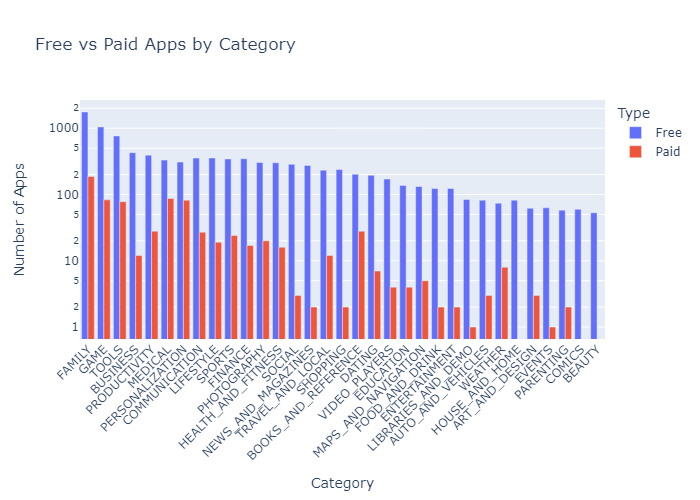

In [64]:
g_bar = px.bar(df_free_vs_paid, 
               x='Category', 
               y='App',
               title='Free vs Paid Apps by Category',
               color='Type', 
               barmode='group',)

g_bar.update_layout(xaxis_title='Category',
                    yaxis_title='Number of Apps',
                    xaxis={'categoryorder':'total descending'},
                    xaxis_tickangle=-45,
                    yaxis=dict(type='log'),
                    )

g_bar.show()

g_bar.write_image("Free_vs_Paid_Apps_by_Category.png")
display(Image(filename='Free_vs_Paid_Apps_by_Category.png'))

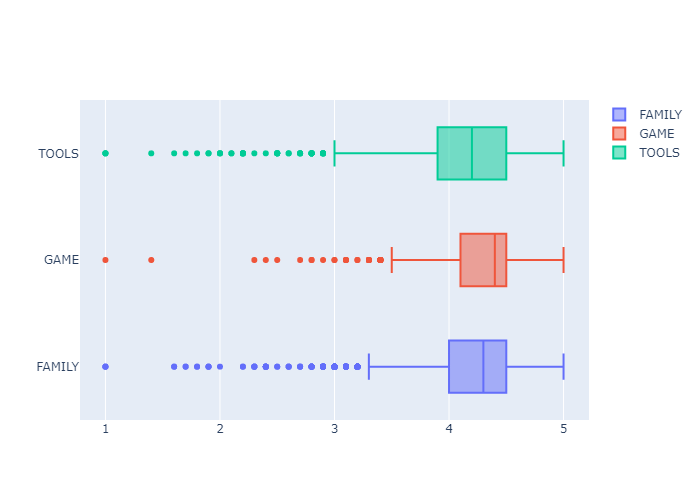

In [65]:
Category1 = data[data.Category=="FAMILY"].Rating
Category2 = data[data.Category=="GAME"].Rating
Category3 = data[data.Category=="TOOLS"].Rating

fig = go.Figure()
fig.add_trace(go.Box(x=Category1, name='FAMILY'))
fig.add_trace(go.Box(x=Category2, name='GAME'))
fig.add_trace(go.Box(x=Category3, name='TOOLS'))

fig.show()

fig.write_image("Rating of Top 3 Category.png")
display(Image(filename='Rating of Top 3 Category.png'))

### Category vs Rating Analysis

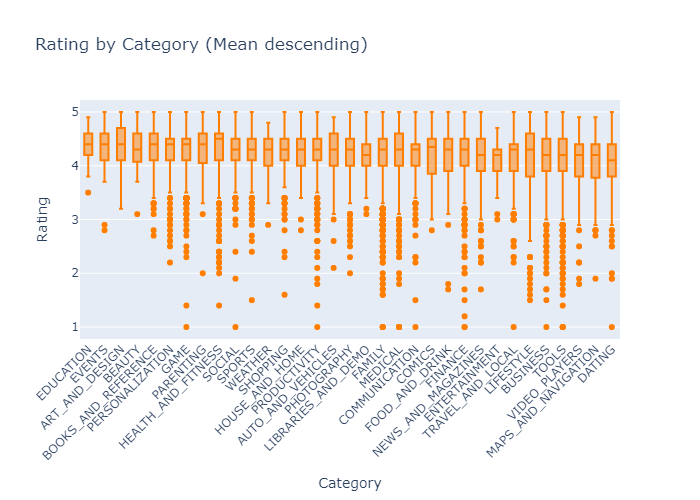

In [66]:
box = px.box(data, x="Category", y="Rating", title="Rating by Category (Mean descending)"
             ,color_discrete_sequence=['#ff7e00 '])
box.update_layout(xaxis_title='Category',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'mean descending'},
                  xaxis_tickangle=-45,
                  #yaxis=dict(type='log')
                 showlegend=False)

box.show()

box.write_image("Rating by Category (Mean descending).png")
display(Image(filename='Rating by Category (Mean descending).png'))

### Type Column

In [67]:
categorical['Type'].value_counts()

Free    9765
Paid     769
Name: Type, dtype: int64

(array([0, 1]), [Text(0, 0, 'Free'), Text(1, 0, 'Paid')])

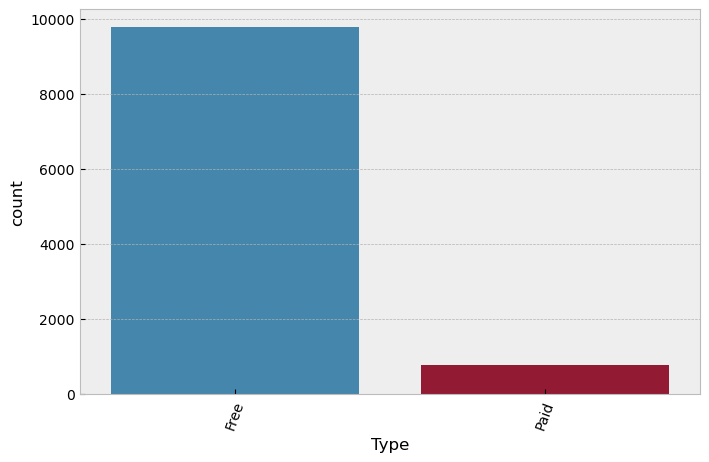

In [68]:
plt.rcParams['figure.figsize'] = (8,5)
sns.countplot(x='Type',data=data)
plt.xticks(rotation=70)

<Axes: ylabel='Type'>

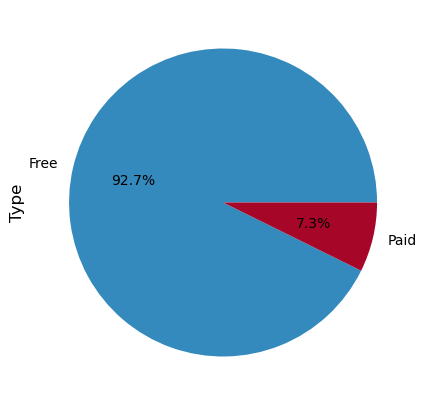

In [69]:
data["Type"].value_counts().plot.pie(autopct = "%1.1f%%")

### Type vs Rating Analysis

<Figure size 1500x800 with 0 Axes>

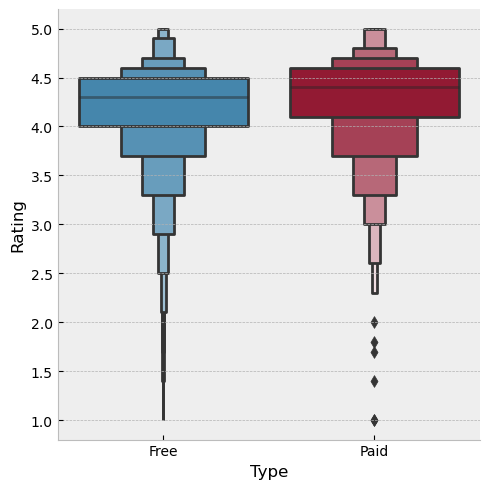

In [70]:
plt.figure(figsize=(15,8))
sns.catplot(y='Rating',x='Type',data = data.sort_values('Rating',ascending=False),kind='boxen')

### Content Rating Column

In [71]:
content_ratings= categorical['Content Rating'].value_counts()

In [72]:
content_ratings


Everyone           8500
Teen               1171
Mature 17+          463
Everyone 10+        395
Adults only 18+       3
Unrated               2
Name: Content Rating, dtype: int64

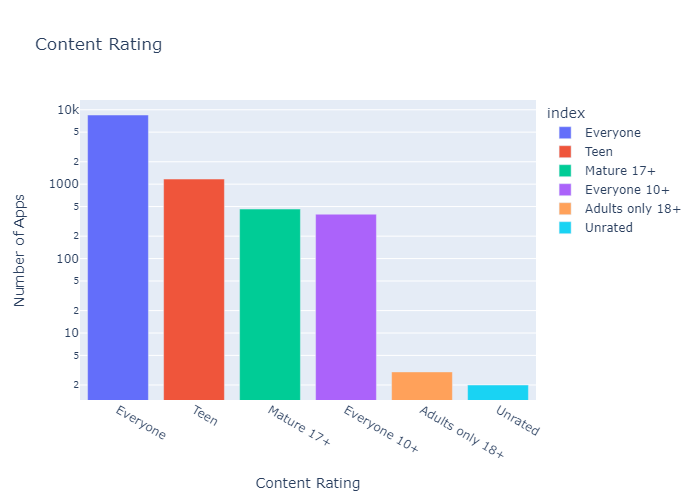

In [73]:
fig = px.bar(content_ratings,
             x=content_ratings.index,
             y=content_ratings.values,
             color = content_ratings.index,
             title="Content Rating")
fig.update_layout(xaxis_title='Content Rating',
                    yaxis_title='Number of Apps',
                    xaxis={'categoryorder':'total descending'},
                    yaxis=dict(type='log'),
                    )

fig.show()


fig.write_image("Content Rating.png")
display(Image(filename='Content Rating.png'))

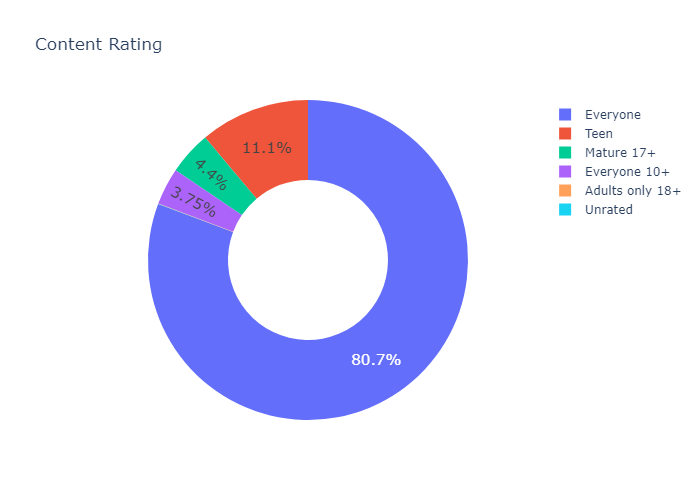

In [74]:
fig = px.pie(labels=content_ratings.index.to_numpy(), 
             values=content_ratings.values,
             title="Content Rating",
             names=content_ratings.index,
             hole=0.5, # makes a donut chart =) 
)
fig.update_traces(textposition='inside', textfont_size=15, textinfo='percent')

fig.show()

fig.write_image("Pie_chart_Content_Rating.png")
display(Image(filename='Pie_chart_Content_Rating.png'))

### Content Rating vs Rating Analysis

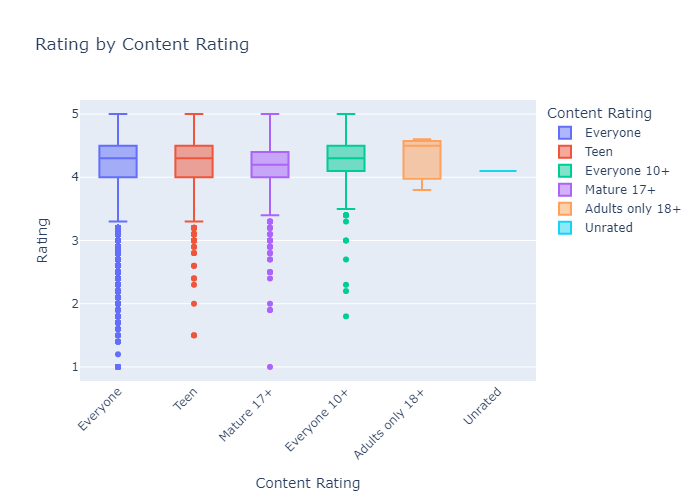

In [75]:
box = px.box(data, x="Content Rating", y="Rating", title="Rating by Content Rating",
             color="Content Rating")
box.update_layout(xaxis_title='Content Rating',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45)

box.show()

box.write_image("Rating_by_Content_Rating.png")
display(Image(filename='Rating_by_Content_Rating.png'))

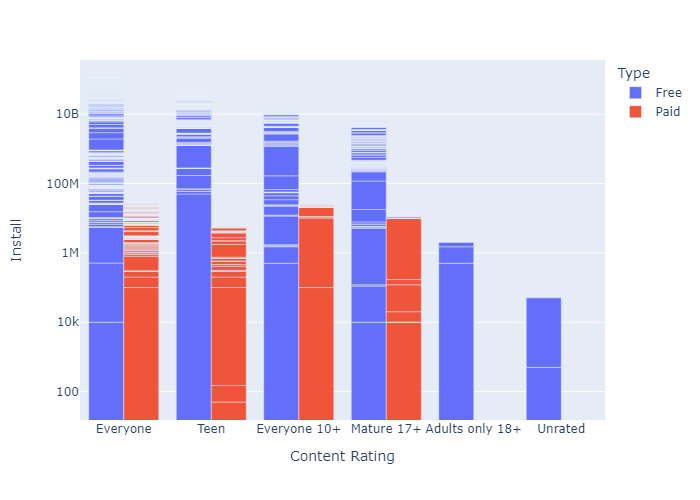

In [76]:
fig = px.bar(data, x='Content Rating'
       , y='Installs',color='Type', barmode='group',)
fig.update_layout(xaxis_title='Content Rating',
                    yaxis_title='Install',
                    xaxis={'categoryorder':'total descending'},
                    yaxis=dict(type='log'),
                    )
fig.show()

fig.write_image("Install_of_Content_Rating_by_Type.png")
display(Image(filename='Install_of_Content_Rating_by_Type.png'))

### Genres Column

In [77]:
categorical['Genres'].value_counts()

Tools                                842
Entertainment                        602
Education                            536
Business                             439
Productivity                         420
                                    ... 
Parenting;Brain Games                  1
Travel & Local;Action & Adventure      1
Lifestyle;Pretend Play                 1
Tools;Education                        1
Strategy;Creativity                    1
Name: Genres, Length: 119, dtype: int64

In [78]:
# Split the strings on the semi-colon and then .stack them. 
stack = categorical.Genres.str.split(';', expand=True).stack()
print(f'We now have a single column with shape: {stack.shape}')
num_genres = stack.value_counts()
print(f'Number of genres: {len(num_genres)}')
print(num_genres)

We now have a single column with shape: (11001,)
Number of genres: 53
Tools                      843
Education                  730
Entertainment              643
Business                   439
Productivity               420
Medical                    417
Personalization            391
Sports                     385
Communication              383
Lifestyle                  376
Action                     376
Finance                    363
Photography                324
Health & Fitness           319
Social                     288
News & Magazines           276
Casual                     264
Travel & Local             245
Shopping                   240
Arcade                     235
Books & Reference          233
Simulation                 216
Dating                     202
Video Players & Editors    178
Puzzle                     163
Maps & Navigation          137
Action & Adventure         130
Food & Drink               125
Role Playing               121
Racing                     119


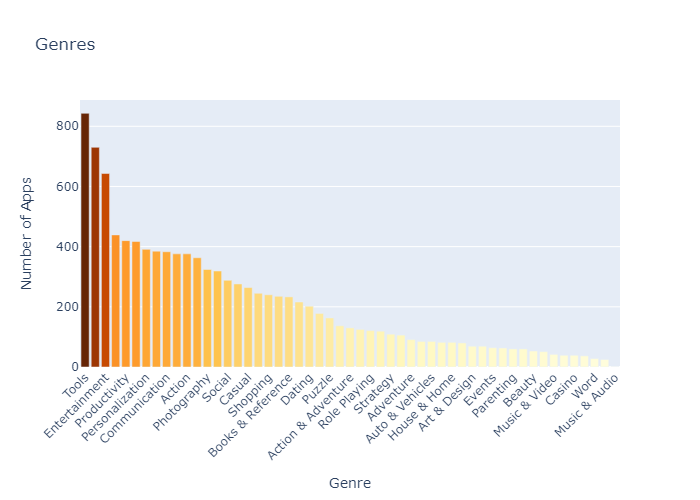

In [79]:
bar = px.bar(
        x = num_genres.index, 
        y = num_genres.values,
        title='Genres',
        hover_name=num_genres.index,
        color=num_genres.values,
        color_continuous_scale='YlOrBr')

bar.update_layout(xaxis_title='Genre',
                  yaxis_title='Number of Apps',
                  xaxis_tickangle=-45,
                  coloraxis_showscale=False)

bar.show()


bar.write_image("Genres.png")
display(Image(filename='Genres.png'))


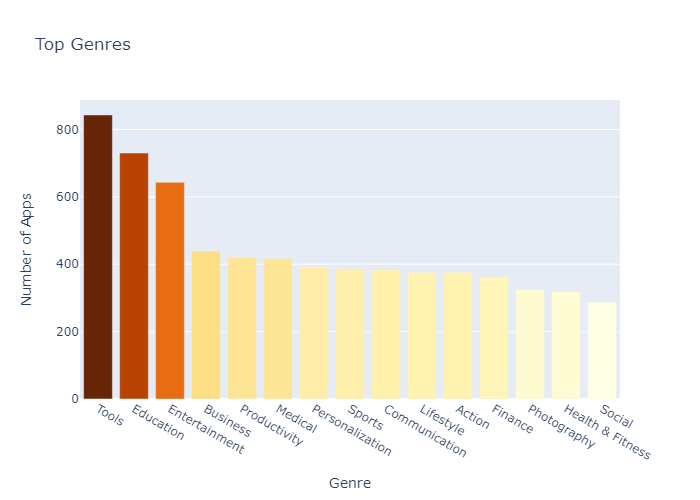

In [80]:
bar = px.bar(
        x = num_genres.index[:15], 
        y = num_genres.values[:15],
        title='Top Genres',
        hover_name=num_genres.index[:15],
        color=num_genres.values[:15],
        color_continuous_scale='YlOrBr')

bar.update_layout(xaxis_title='Genre',
                  yaxis_title='Number of Apps',
                  coloraxis_showscale=False)

bar.show()

bar.write_image("Top_Genres.png")
display(Image(filename='Top_Genres.png'))

### Rating vs Genres Analysis

In [81]:
top_15_genres = num_genres.head(15).index
Top_Genres = data[data.Genres.isin(top_15_genres)]
Num_genres = data[data.Genres.isin(num_genres.index)]

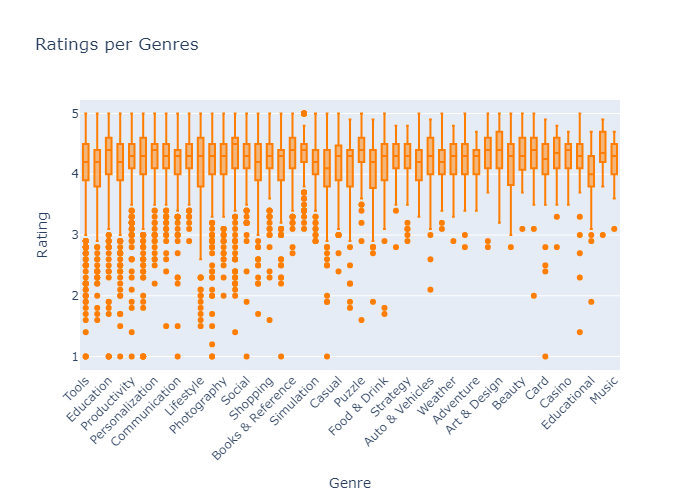

In [82]:
box = px.box(Num_genres, 
             x='Genres', 
             y='Rating',
             title='Ratings per Genres',
            color_discrete_sequence=['#ff7e00 '])

box.update_layout(xaxis_title='Genre',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45,
                  showlegend=False)


box.show()

box.write_image("Ratings per Genres.png")
display(Image(filename='Ratings per Genres.png'))


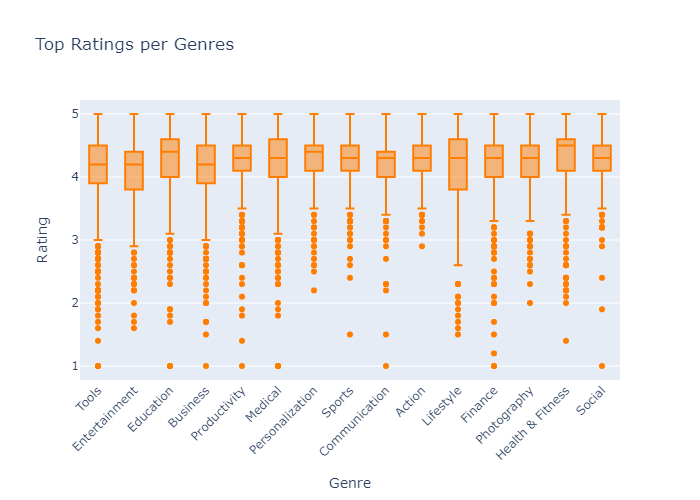

In [83]:
box = px.box(Top_Genres, 
             x='Genres', 
             y='Rating',
             title='Top Ratings per Genres',
            color_discrete_sequence=['#ff7e00 '])

box.update_layout(xaxis_title='Genre',
                  yaxis_title='Rating',
                  xaxis={'categoryorder':'total descending'},
                  xaxis_tickangle=-45,
                  showlegend=False)


box.show()

box.write_image("Top_Ratings per Genres.png")
display(Image(filename='Top_Ratings per Genres.png'))


### Current Ver Column

In [84]:
categorical['Current Ver'].value_counts()

Varies with device    1454
1.0                    805
1.1                    260
1.2                    178
2.0                    149
                      ... 
12.2.7.3671              1
8.50.935520              1
1.8.4.5                  1
2.9.10                   1
2.0.148.0                1
Name: Current Ver, Length: 2831, dtype: int64

### Android Ver Column

In [85]:
categorical['Android Ver'].value_counts()

4.1 and up            2385
4.0.3 and up          1460
Varies with device    1358
4.0 and up            1340
4.4 and up             905
2.3 and up             644
5.0 and up             557
4.2 and up             387
2.3.3 and up           279
2.2 and up             240
3.0 and up             237
4.3 and up             235
2.1 and up             133
1.6 and up             116
6.0 and up              58
7.0 and up              42
3.2 and up              36
2.0 and up              32
5.1 and up              22
1.5 and up              20
4.4W and up             11
3.1 and up              10
2.0.1 and up             7
8.0 and up               6
7.1 and up               3
4.0.3 - 7.1.1            2
5.0 - 8.0                2
1.0 and up               2
7.0 - 7.1.1              1
4.1 - 7.1.1              1
5.0 - 6.0                1
2.2 - 7.1.1              1
5.0 - 7.1.1              1
Name: Android Ver, dtype: int64

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, '4.0.3 and up'),
  Text(1, 0, '4.2 and up'),
  Text(2, 0, '4.4 and up'),
  Text(3, 0, '2.3 and up'),
  Text(4, 0, '3.0 and up'),
  Text(5, 0, '4.1 and up'),
  Text(6, 0, '4.0 and up'),
  Text(7, 0, '2.3.3 and up'),
  Text(8, 0, 'Varies with device'),
  Text(9, 0, '2.2 and up'),
  Text(10, 0, '5.0 and up'),
  Text(11, 0, '6.0 and up'),
  Text(12, 0, '1.6 and up'),
  Text(13, 0, '1.5 and up'),
  Text(14, 0, '2.1 and up'),
  Text(15, 0, '7.0 and up'),
  Text(16, 0, '5.1 and up'),
  Text(17, 0, '4.3 and up'),
  Text(18, 0, '4.0.3 - 7.1.1'),
  Text(19, 0, '2.0 and up'),
  Text(20, 0, '3.2 and up'),
  Text(21, 0, '4.4W and up'),
  Text(22, 0, '7.1 and up'),
  Text(23, 0, '7.0 - 7.1.1'),
  Text(24, 0, '8.0 and up'),
  Text(25, 0, '5.0 - 8.0'),
  Text(26, 0, '3.1 and up'),
  Text(27, 0, '2.0.1 and up'),
  Text(28, 0, '4.1 - 7.1.1'),


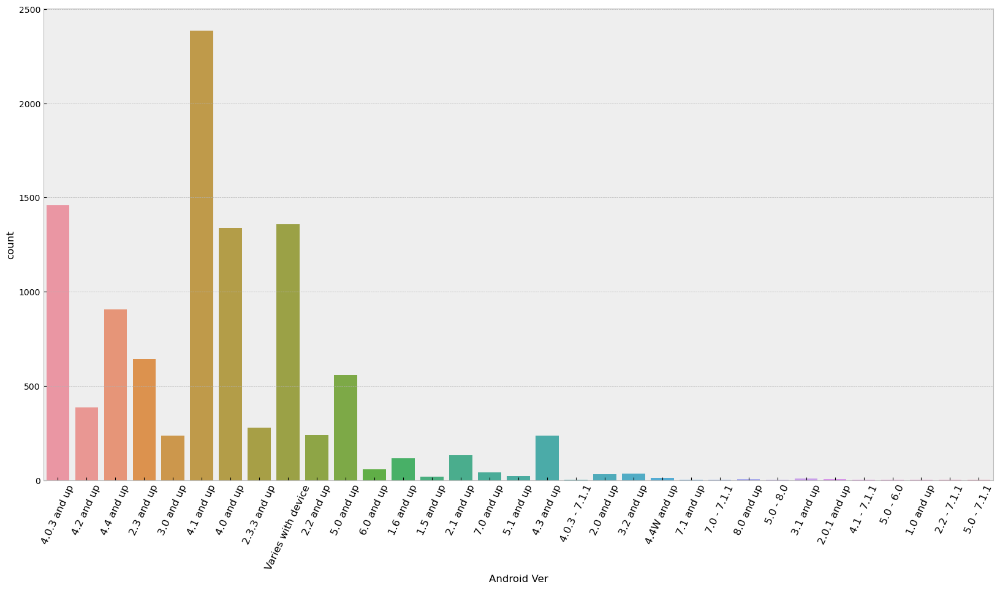

In [86]:
plt.figure(figsize=(20,10))
sns.countplot(x='Android Ver',data=data)
plt.xticks(rotation=65)
plt.xticks(fontsize=12)

### Rating vs Android Ver Analysis

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]),
 [Text(0, 0, '4.4 and up'),
  Text(1, 0, '4.1 and up'),
  Text(2, 0, '4.0 and up'),
  Text(3, 0, '2.0.1 and up'),
  Text(4, 0, '2.3 and up'),
  Text(5, 0, '4.0.3 and up'),
  Text(6, 0, '3.0 and up'),
  Text(7, 0, '1.6 and up'),
  Text(8, 0, '4.2 and up'),
  Text(9, 0, '5.1 and up'),
  Text(10, 0, '4.3 and up'),
  Text(11, 0, '5.0 and up'),
  Text(12, 0, '2.2 and up'),
  Text(13, 0, '8.0 and up'),
  Text(14, 0, 'Varies with device'),
  Text(15, 0, '3.2 and up'),
  Text(16, 0, '2.3.3 and up'),
  Text(17, 0, '2.0 and up'),
  Text(18, 0, '7.0 and up'),
  Text(19, 0, '2.1 and up'),
  Text(20, 0, '6.0 and up'),
  Text(21, 0, '1.5 and up'),
  Text(22, 0, '7.1 and up'),
  Text(23, 0, '3.1 and up'),
  Text(24, 0, '5.0 - 8.0'),
  Text(25, 0, '1.0 and up'),
  Text(26, 0, '5.0 - 6.0'),
  Text(27, 0, '4.4W and up'),
  Text(28, 0, '7.0 - 7.1.1'),
  Tex

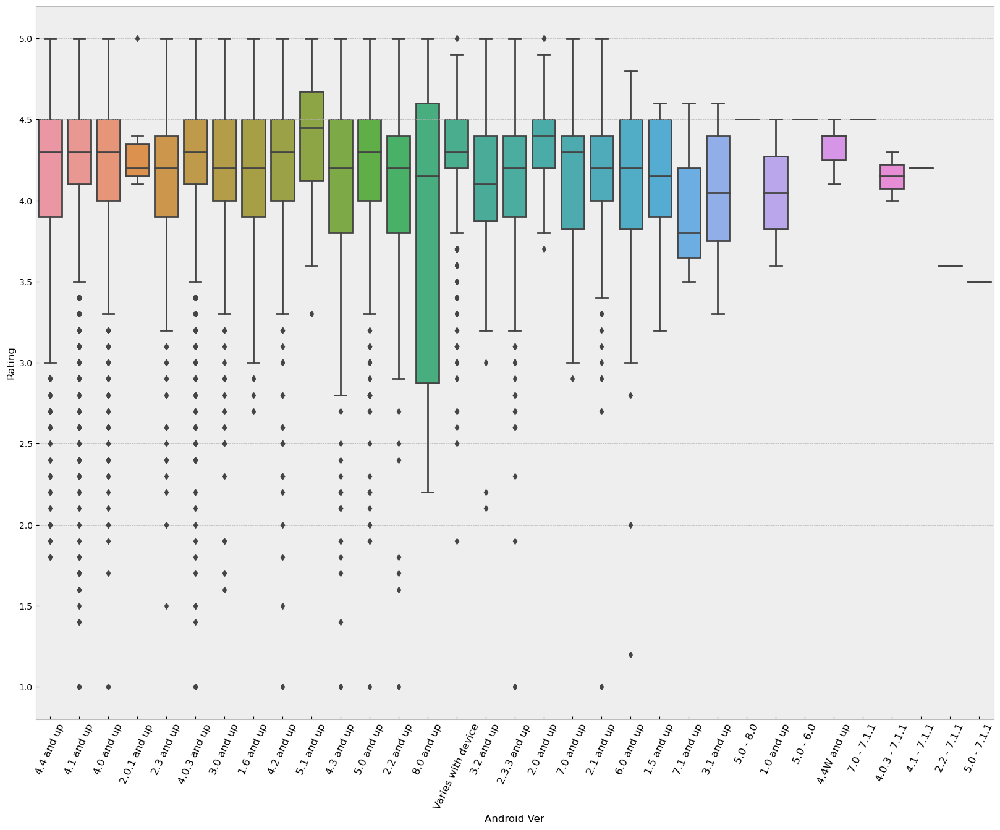

In [87]:
plt.figure(figsize=(20,15))
sns.boxplot(y='Rating',x='Android Ver',data = data.sort_values('Rating',ascending=False))
plt.xticks(rotation=65)
plt.xticks(fontsize=12)


### Defining violin, box and joint plot & kde_plot functions

In [88]:

def violin_and_show(col):
    title = "Violin Plot of {} by Type".format(col)
    fig = px.violin(data, y=col, x="Type", color="Type",
                    box=True, template='presentation')
    fig.update_layout(title=title)
    fig.show()
    image_filename = f"{title}.png"
    fig.write_image(image_filename)
    img = Image(image_filename)
    display(img)
    

def box_and_show(col):
    title = "Box Plot of {} by Type".format(col)
    box = px.box(data, y=col, x='Type', color='Type', notched=True, 
             points='all', template='presentation')
    box.update_layout(title=title ,yaxis=dict(type='log'))
    box.show()
    image_filename = f"{title}.png"
    box.write_image(image_filename)
    img = Image(image_filename)
    display(img)


def jointplot(col1, col2):
    sns.set(style="whitegrid", context="notebook")
    palette = ["#1e90ff" , "#ff8f00"]
    grid = sns.jointplot(data=data, x=col1, y=col2
                         , kind="scatter", hue="Type"
                         , height=6, palette=palette)


def kde_plot(feature):
    sns.set(style="whitegrid", context="notebook")
    palette = ["#1e90ff" , "#ff8f00"]
    grid = sns.FacetGrid(data, hue="Type", aspect=2, palette=palette)
    grid.map(sns.kdeplot, feature)
    grid.add_legend()
    x_min = data[feature].min()
    x_max = data[feature].max()
    grid.set(xlim=(x_min, x_max))



* kde_plot Analysis

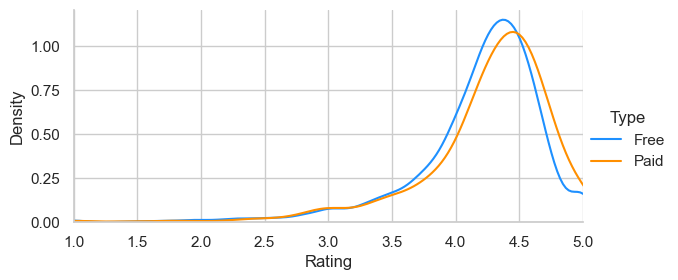

In [89]:
kde_plot('Rating')

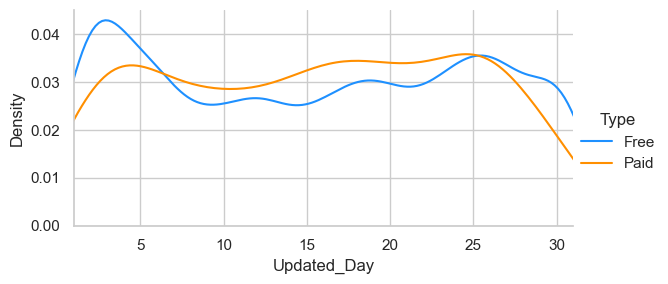

In [90]:
kde_plot('Updated_Day')

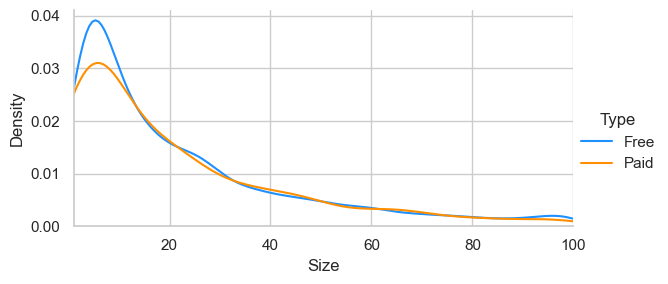

In [91]:
kde_plot('Size')

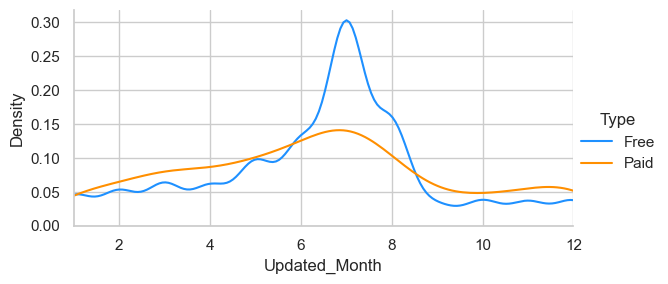

In [92]:
kde_plot('Updated_Month')

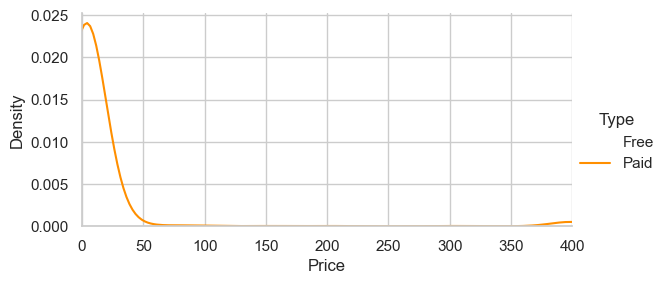

In [93]:
kde_plot('Price')

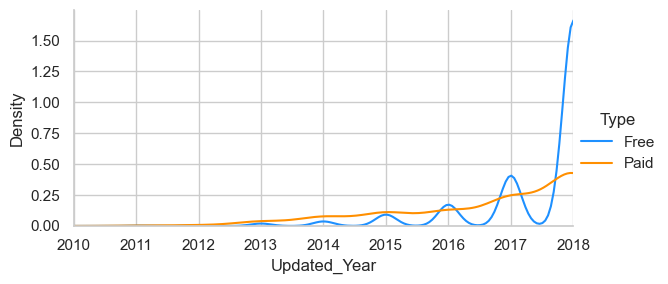

In [94]:
kde_plot('Updated_Year')

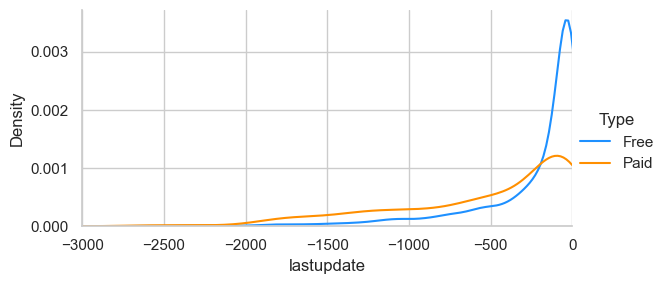

In [95]:
kde_plot('lastupdate')

* Joint plot Analysis

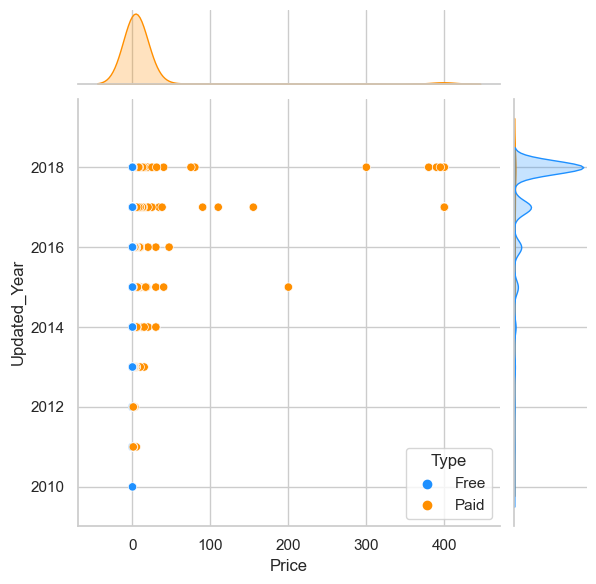

In [96]:
jointplot('Price', 'Updated_Year')

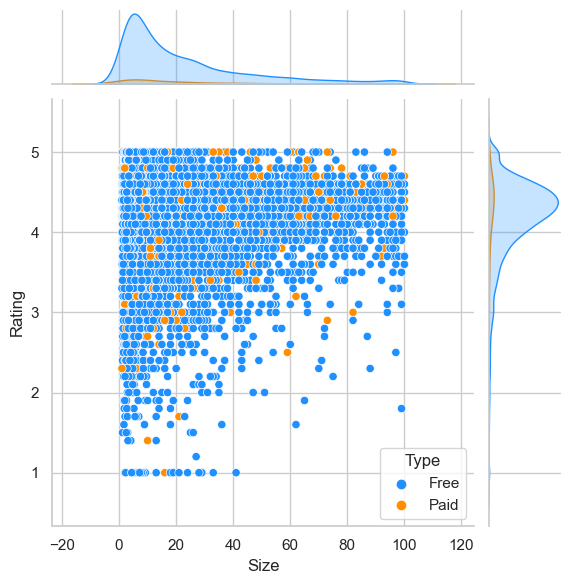

In [97]:
jointplot('Size', 'Rating')

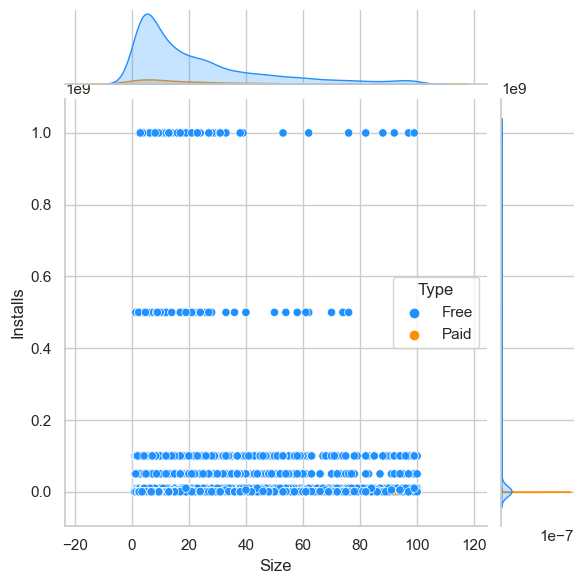

In [98]:
jointplot('Size', 'Installs')

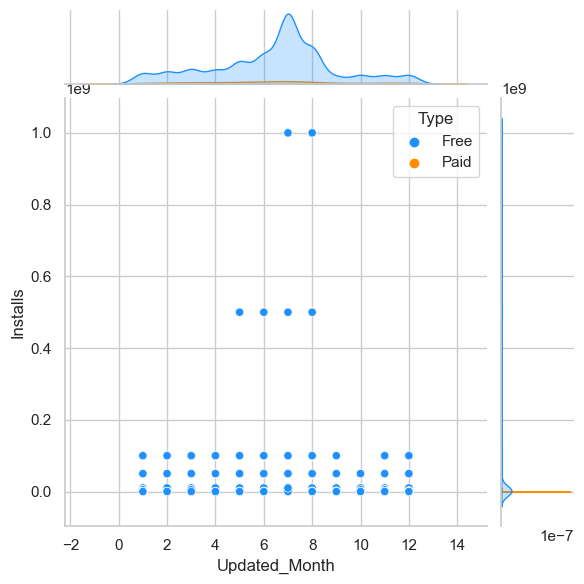

In [99]:
jointplot('Updated_Month', 'Installs')

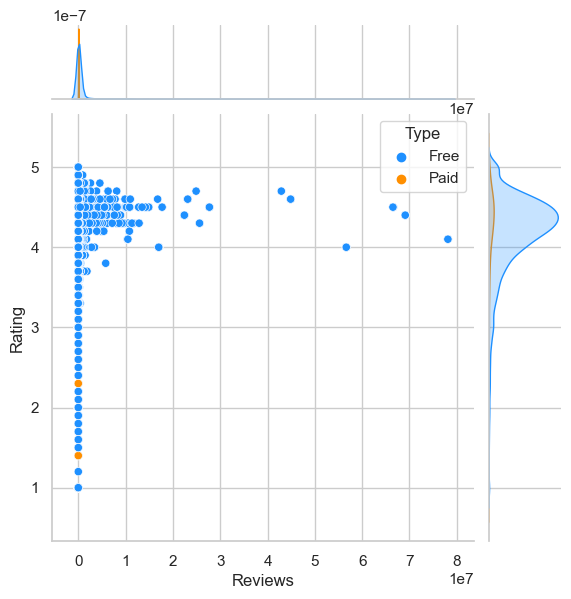

In [100]:
jointplot('Reviews', 'Rating')

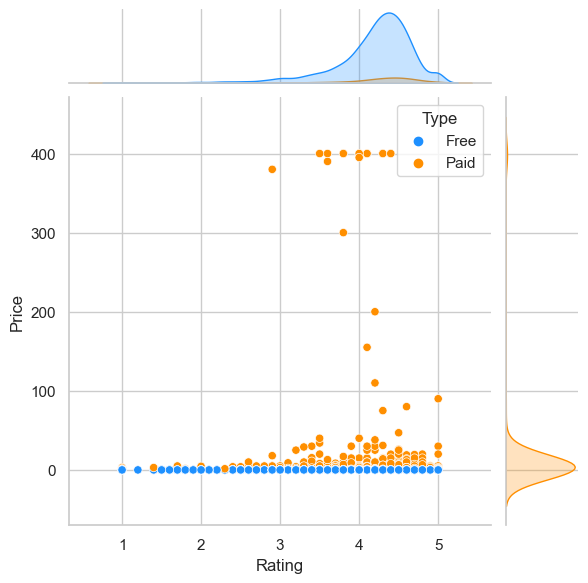

In [101]:
jointplot('Rating', 'Price')

 * violin plot Analysis

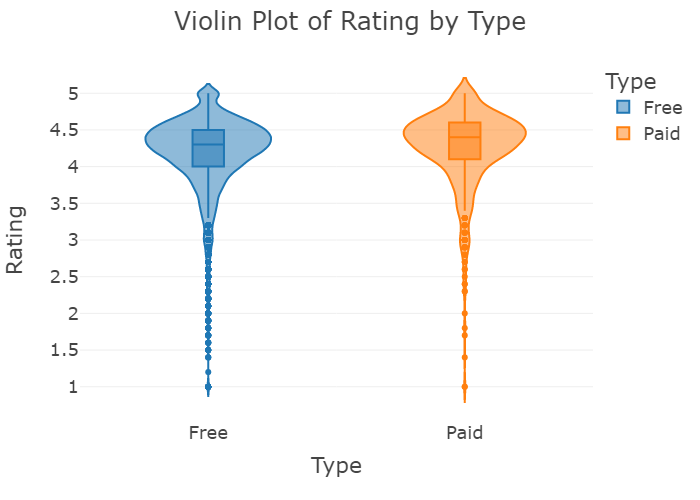

In [102]:
violin_and_show('Rating')

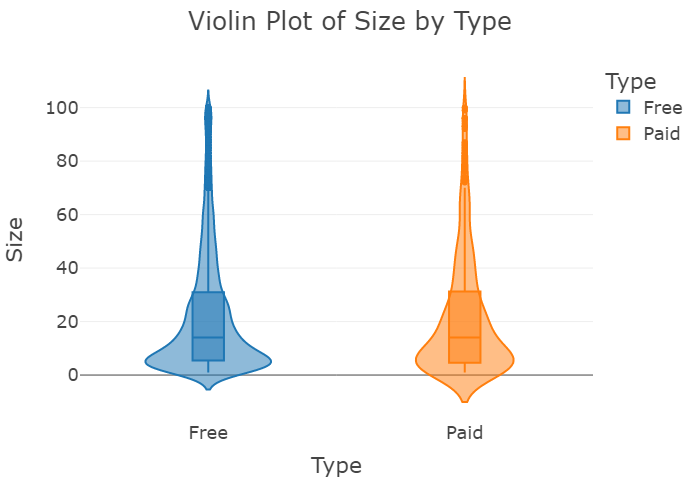

In [103]:
violin_and_show('Size')

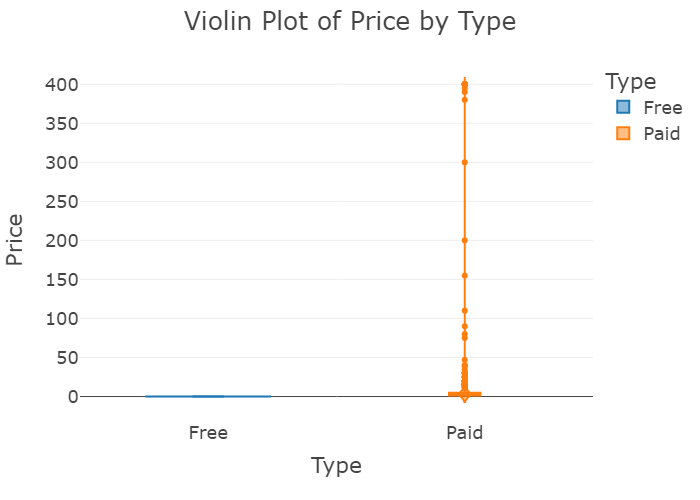

In [104]:
violin_and_show('Price')

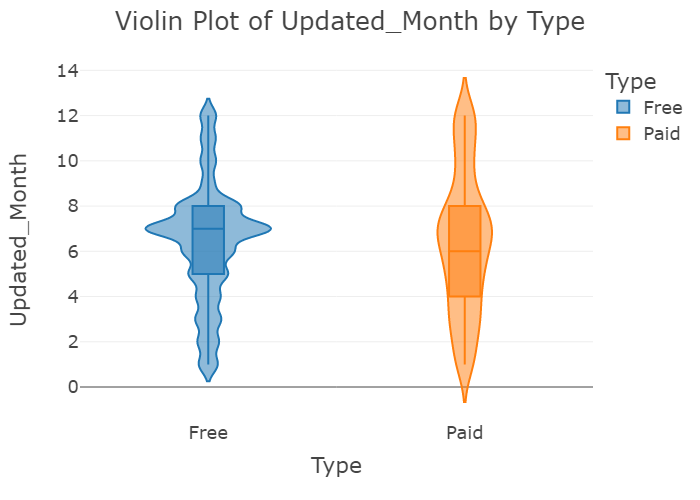

In [105]:
violin_and_show('Updated_Month')

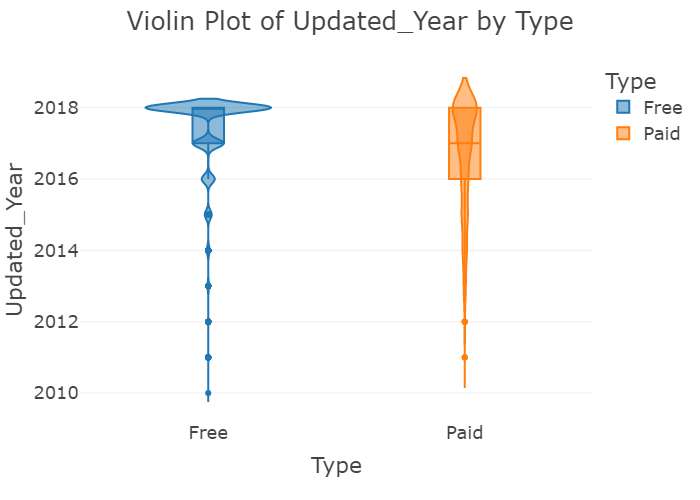

In [106]:
violin_and_show('Updated_Year')

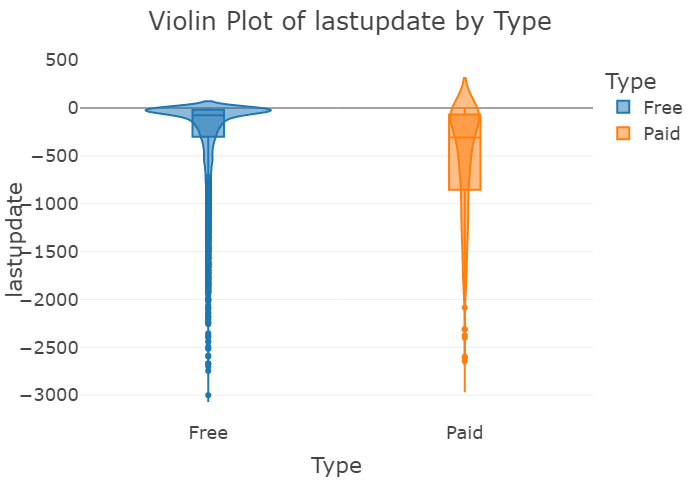

In [107]:
violin_and_show("lastupdate")

* Box plot analysis

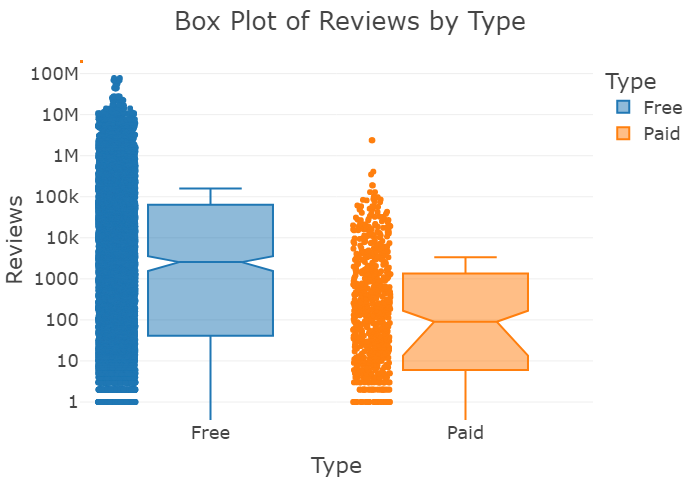

In [108]:
box_and_show('Reviews')

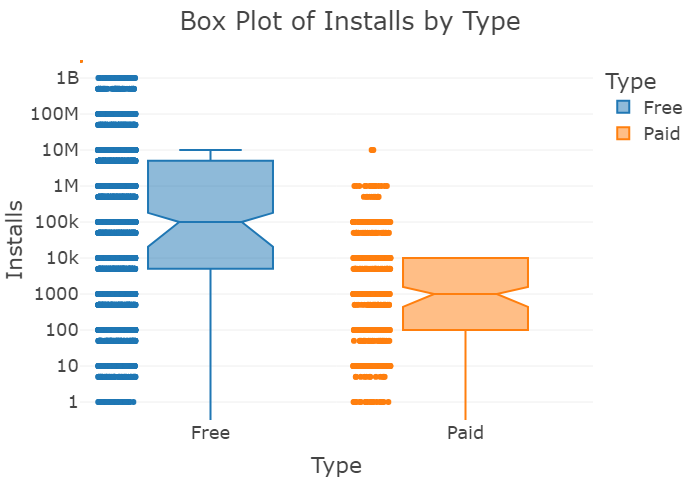

In [109]:
box_and_show('Installs')

Text(0.5, 1.0, 'Time series plot of Last Updates')

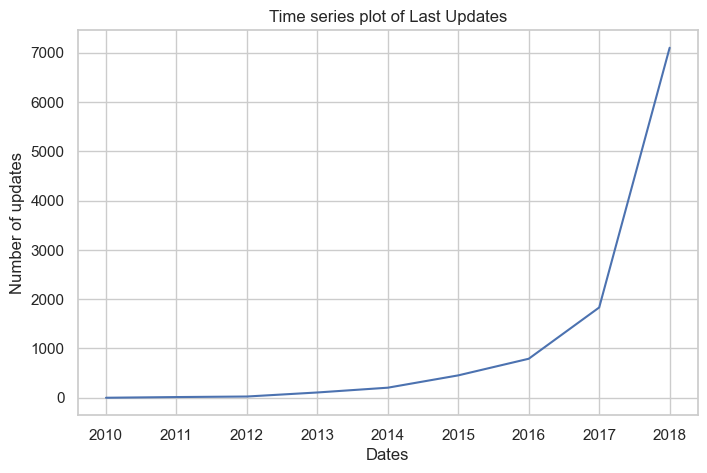

In [110]:
freq= pd.Series()
freq=data['Updated_Year'].value_counts()
freq.plot()
plt.xlabel("Dates")
plt.ylabel("Number of updates")
plt.title("Time series plot of Last Updates")

# Check Co-relation


In [111]:
corelation = pd.DataFrame({'corelation' : data.corr()["Rating"].abs().sort_values(ascending=False)[1:]})
corelation

,corelation
lastupdate,0.119288
Updated_Year,0.114533
Reviews,0.062689
Size,0.053278
Installs,0.048477
Price,0.018245
Updated_Month,0.014220
Updated_Day,0.007069


In [112]:
plt.style.use('ggplot')

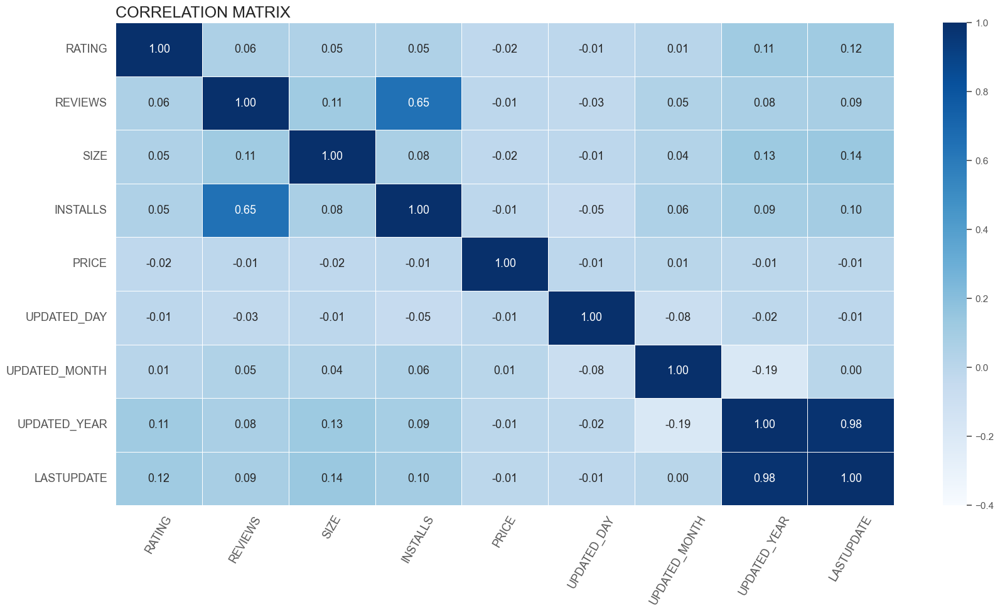

In [113]:
corelation = data.corr()

fig, ax = plt.subplots(figsize=(20,10))


sns.heatmap(data=corelation, 
            annot=True, annot_kws={"fontsize":13}, fmt=".2f", 
            cmap= "Blues",
            vmin=-0.4, vmax=1,
            linecolor='white', linewidths=0.5);

yticks = [i.upper() for i in corelation.index]
xticks = [i.upper() for i in corelation.columns]

ax.set_yticklabels(yticks, rotation=0, fontsize=13);
ax.set_xticklabels(xticks, rotation=60, fontsize=13);
title = 'CORRELATION MATRIX'
ax.set_title(title, loc='left', fontsize=18);


# Separate dependent & independent features

In [114]:
y=data['Rating']
X=num_data
cols=X.columns
cols

Index(['Rating', 'Reviews', 'Size', 'Installs', 'Price', 'Updated_Day',
       'Updated_Month', 'Updated_Year', 'lastupdate'],
      dtype='object')

# Splitting Dataset


In [115]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(X,y,train_size=0.75,random_state= 42)

In [116]:
# Import Libraries
from sklearn.preprocessing import StandardScaler

In [117]:
#Creating a StandardScaler object to normalize the X train and test set feature data
scaler = StandardScaler()
X_train = scaler.fit_transform(x_train)
X_test = scaler.transform(x_test)


# Defining function For ML model

In [118]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split


In [136]:
def predict(ml_model):          
    model = ml_model.fit(X_train, y_train)
    
    y_train_prediction = model.predict(X_train)
    y_test_prediction = model.predict(X_test)
    
    print('Train predictions are: \n', y_train_prediction[:12])
    print('\nTest predictions are: \n', y_test_prediction[:12])
    print('\n')
    
    r2_train = metrics.r2_score(y_train, y_train_prediction)
    r2_test = metrics.r2_score(y_test, y_test_prediction)
    
    print('Train r2 score:', r2_train)
    print('Test r2 score:', r2_test)
    
    print('Train MAE:', metrics.mean_absolute_error(y_train, y_train_prediction))
    print('Test MAE:', metrics.mean_absolute_error(y_test, y_test_prediction))
    
    print('Train MSE:', metrics.mean_squared_error(y_train, y_train_prediction))
    print('Test MSE:', metrics.mean_squared_error(y_test, y_test_prediction))
    
    print('Train RMSE:', np.sqrt(metrics.mean_squared_error(y_train, y_train_prediction)))
    print('Test RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_prediction)))


# Model Result


### LinearRegression

In [137]:
predict(LinearRegression())

Train predictions are: 
 [3.48416007 4.70979072 4.29611441 4.19897587 4.81256163 4.09613185
 3.99282638 4.19699793 3.88998899 3.68496629 3.58185804 4.81250604]

Test predictions are: 
 [4.09338405 4.6101473  4.40206173 4.40208016 3.68385531 4.09601901
 3.9908902  3.27336605 3.5820602  3.99082923 4.40484815 4.40247709]


Train r2 score: 0.9924000291187145
Test r2 score: 0.9942931563132688
Train MAE: 0.011367088837103391
Test MAE: 0.010871289409987526
Train MSE: 0.002069454524430152
Test MSE: 0.0015532615834664802
Train RMSE: 0.04549125767034972
Test RMSE: 0.03941143975378824


### Decision Tree Regression

In [138]:
predict(DecisionTreeRegressor())

Train predictions are: 
 [3.5 4.7 4.3 4.2 4.8 4.1 4.  4.2 3.9 3.7 3.6 4.8]

Test predictions are: 
 [4.1 4.6 4.4 4.4 3.7 4.1 4.  3.3 3.6 4.  4.4 4.4]


Train r2 score: 1.0
Test r2 score: 0.9949226513184692
Train MAE: 2.669476454232758e-14
Test MAE: 0.0022019741837764188
Train MSE: 1.3832064605848895e-27
Test MSE: 0.0013819286256643887
Train RMSE: 3.719148371045298e-14
Test RMSE: 0.037174300607602406


### KNeighborsRegressor

In [161]:
n_neighbors_list = range(1, 51)
knn_train_r2_scores = []
knn_test_r2_scores = []

for n_neighbors in n_neighbors_list:
    model = KNeighborsRegressor(n_neighbors=n_neighbors)
    model.fit(X_train, y_train)
    y_train_prediction = model.predict(X_train)
    y_test_prediction = model.predict(X_test)
    
    train_r2 = metrics.r2_score(y_train, y_train_prediction)
    test_r2 = metrics.r2_score(y_test, y_test_prediction)
    
    knn_train_r2_scores.append(train_r2)
    knn_test_r2_scores.append(test_r2)



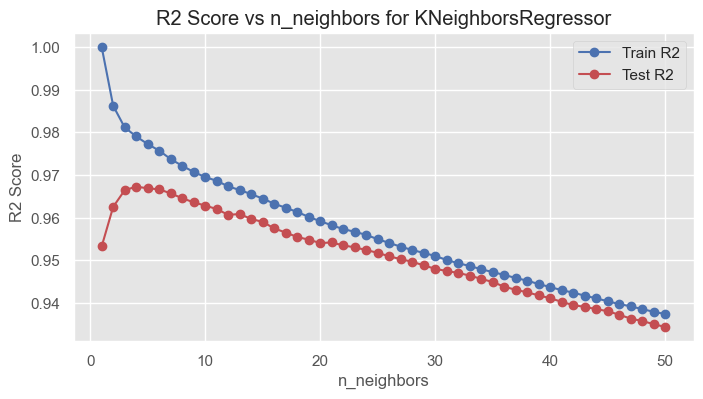

In [160]:
plt.figure(figsize=(8, 4))
plt.plot(n_neighbors_list, knn_train_r2_scores, label='Train R2', marker='o', color='b')
plt.plot(n_neighbors_list, knn_test_r2_scores, label='Test R2', marker='o', color='r')
plt.title('R2 Score vs n_neighbors for KNeighborsRegressor')
plt.xlabel('n_neighbors')
plt.ylabel('R2 Score')
plt.legend()
plt.grid(True)
plt.show()

In [164]:
n_neighbors_list = range(1, 51)
knn_train_mae_scores = []
knn_test_mae_scores = []
knn_train_mse_scores = []
knn_test_mse_scores = []
knn_train_rmse_scores = []
knn_test_rmse_scores = []

for n_neighbors in n_neighbors_list:
    model = KNeighborsRegressor(n_neighbors=n_neighbors)
    model.fit(X_train, y_train)
    y_train_prediction = model.predict(X_train)
    y_test_prediction = model.predict(X_test)

    train_mae = metrics.mean_absolute_error(y_train, y_train_prediction)
    test_mae = metrics.mean_absolute_error(y_test, y_test_prediction)
    train_mse = metrics.mean_squared_error(y_train, y_train_prediction)
    test_mse = metrics.mean_squared_error(y_test, y_test_prediction)
    train_rmse = np.sqrt(train_mse)
    test_rmse = np.sqrt(test_mse)
    
    knn_train_mae_scores.append(train_mae)
    knn_test_mae_scores.append(test_mae)
    knn_train_mse_scores.append(train_mse)
    knn_test_mse_scores.append(test_mse)
    knn_train_rmse_scores.append(train_rmse)
    knn_test_rmse_scores.append(test_rmse)


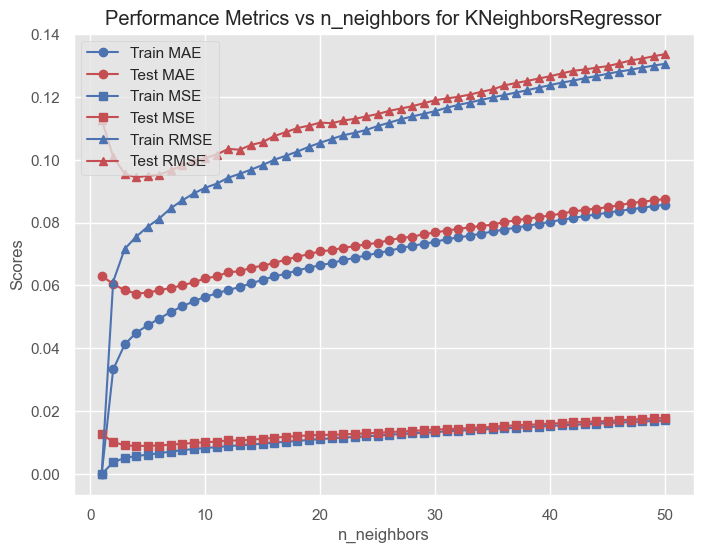

In [165]:
plt.figure(figsize=(8, 6))
plt.plot(n_neighbors_list, knn_train_mae_scores, label='Train MAE', marker='o', color='b')
plt.plot(n_neighbors_list, knn_test_mae_scores, label='Test MAE', marker='o', color='r')
plt.plot(n_neighbors_list, knn_train_mse_scores, label='Train MSE', marker='s', color='b')
plt.plot(n_neighbors_list, knn_test_mse_scores, label='Test MSE', marker='s', color='r')
plt.plot(n_neighbors_list, knn_train_rmse_scores, label='Train RMSE', marker='^', color='b')
plt.plot(n_neighbors_list, knn_test_rmse_scores, label='Test RMSE', marker='^', color='r')

plt.title('Performance Metrics vs n_neighbors for KNeighborsRegressor')
plt.xlabel('n_neighbors')
plt.ylabel('Scores')
plt.legend()
plt.grid(True)
plt.show()

In [144]:
best_r2_train_index = np.argmax(knn_train_r2_scores)
best_r2_test_index = np.argmax(knn_test_r2_scores)

best_mae_train_index = np.argmin(knn_train_mae_scores)
best_mae_test_index = np.argmin(knn_test_mae_scores)

best_mse_train_index = np.argmin(knn_train_mse_scores)
best_mse_test_index = np.argmin(knn_test_mse_scores)

best_rmse_train_index = np.argmin(knn_train_rmse_scores)
best_rmse_test_index = np.argmin(knn_test_rmse_scores)

best_r2_train_neighbors = n_neighbors_list[best_r2_train_index]
best_r2_test_neighbors = n_neighbors_list[best_r2_test_index]

best_mae_train_neighbors = n_neighbors_list[best_mae_train_index]
best_mae_test_neighbors = n_neighbors_list[best_mae_test_index]

best_mse_train_neighbors = n_neighbors_list[best_mse_train_index]
best_mse_test_neighbors = n_neighbors_list[best_mse_test_index]

best_rmse_train_neighbors = n_neighbors_list[best_rmse_train_index]
best_rmse_test_neighbors = n_neighbors_list[best_rmse_test_index]

print("Best R2 Score - Train:")
print("n_neighbors =", best_r2_train_neighbors)
print("R2 Score =", knn_train_r2_scores[best_r2_train_index])
print()

print("Best R2 Score - Test:")
print("n_neighbors =", best_r2_test_neighbors)
print("R2 Score =", knn_test_r2_scores[best_r2_test_index])
print()

print("Best MAE - Train:")
print("n_neighbors =", best_mae_train_neighbors)
print("MAE =", knn_train_mae_scores[best_mae_train_index])
print()

print("Best MAE - Test:")
print("n_neighbors =", best_mae_test_neighbors)
print("MAE =", knn_test_mae_scores[best_mae_test_index])
print()

print("Best MSE - Train:")
print("n_neighbors =", best_mse_train_neighbors)
print("MSE =", knn_train_mse_scores[best_mse_train_index])
print()

print("Best MSE - Test:")
print("n_neighbors =", best_mse_test_neighbors)
print("MSE =", knn_test_mse_scores[best_mse_test_index])
print()

print("Best RMSE - Train:")
print("n_neighbors =", best_rmse_train_neighbors)
print("RMSE =", knn_train_rmse_scores[best_rmse_train_index])
print()

print("Best RMSE - Test:")
print("n_neighbors =", best_rmse_test_neighbors)
print("RMSE =", knn_test_rmse_scores[best_rmse_test_index])


Best R2 Score - Train:
n_neighbors = 1
R2 Score = 1.0

Best R2 Score - Test:
n_neighbors = 4
R2 Score = 0.9672814395573746

Best MAE - Train:
n_neighbors = 1
MAE = 0.0

Best MAE - Test:
n_neighbors = 4
MAE = 0.057441154138192896

Best MSE - Train:
n_neighbors = 1
MSE = 0.0

Best MSE - Test:
n_neighbors = 4
MSE = 0.008905182232346244

Best RMSE - Train:
n_neighbors = 1
RMSE = 0.0

Best RMSE - Test:
n_neighbors = 4
RMSE = 0.09436727310008615


### Random Forest Regression

In [153]:
n_estimators_list = range(5, 50, 1)
rd_train_r2_scores = []
rd_test_r2_scores = []

for n in n_estimators_list:
    model = RandomForestRegressor(n_estimators=n, n_jobs=-1, random_state=42)
    model.fit(X_train, y_train)
    y_train_prediction = model.predict(X_train)
    y_test_prediction = model.predict(X_test)
    
    train_r2 = metrics.r2_score(y_train, y_train_prediction)
    test_r2 = metrics.r2_score(y_test, y_test_prediction)
    
    rd_train_r2_scores.append(train_r2)
    rd_test_r2_scores.append(test_r2)


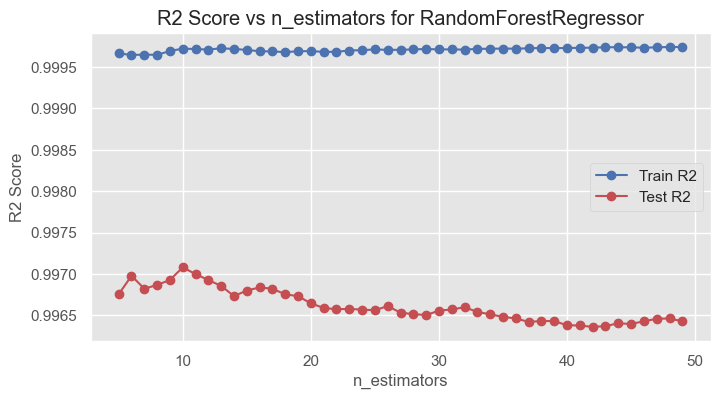

In [156]:
plt.figure(figsize=(8, 4))
plt.plot(n_estimators_list, rd_train_r2_scores, label='Train R2', marker='o', color = "b")
plt.plot(n_estimators_list, rd_test_r2_scores, label='Test R2', marker='o', color = "r")
plt.title('R2 Score vs n_estimators for RandomForestRegressor')
plt.xlabel('n_estimators')
plt.ylabel('R2 Score')
plt.legend()
plt.grid(True)
plt.show()

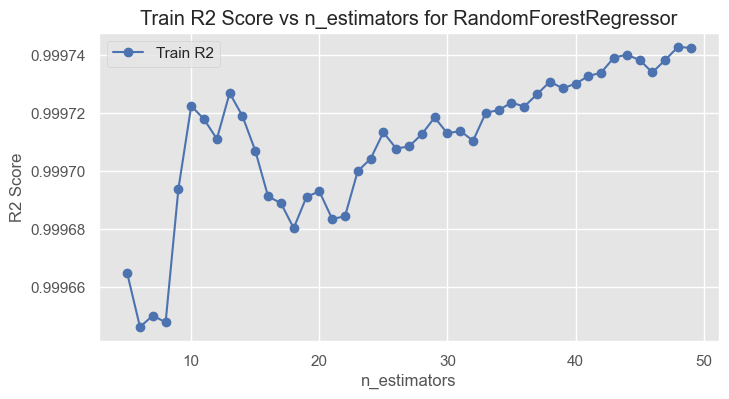

In [157]:
plt.figure(figsize=(8, 4))
plt.plot(n_estimators_list, rd_train_r2_scores, label='Train R2', marker='o', color = "b")
plt.title('Train R2 Score vs n_estimators for RandomForestRegressor')
plt.xlabel('n_estimators')
plt.ylabel('R2 Score')
plt.legend()
plt.grid(True)
plt.show()

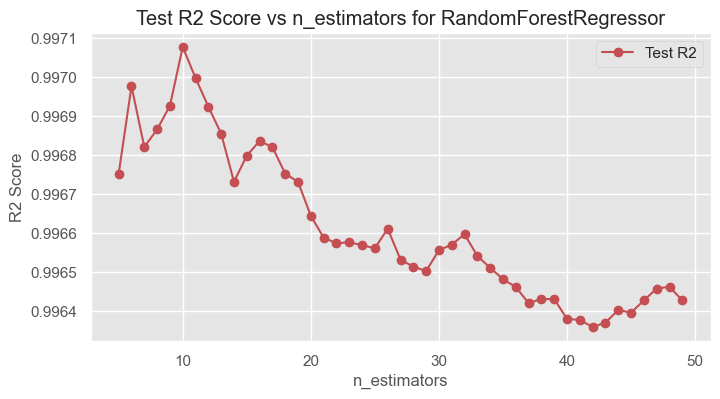

In [158]:
plt.figure(figsize=(8, 4))
plt.plot(n_estimators_list, rd_test_r2_scores, label='Test R2', marker='o', color = "r")
plt.title('Test R2 Score vs n_estimators for RandomForestRegressor')
plt.xlabel('n_estimators')
plt.ylabel('R2 Score')
plt.legend()
plt.grid(True)
plt.show()

In [166]:
n_estimators_list = range(5, 50, 1)
rd_train_mae_scores = []
rd_test_mae_scores = []
rd_train_mse_scores = []
rd_test_mse_scores = []
rd_train_rmse_scores = []
rd_test_rmse_scores = []

for n in n_estimators_list:
    model = RandomForestRegressor(n_estimators=n, n_jobs=-1, random_state=42)
    model.fit(X_train, y_train)
    y_train_prediction = model.predict(X_train)
    y_test_prediction = model.predict(X_test)
    
    train_mae = metrics.mean_absolute_error(y_train, y_train_prediction)
    test_mae = metrics.mean_absolute_error(y_test, y_test_prediction)
    train_mse = metrics.mean_squared_error(y_train, y_train_prediction)
    test_mse = metrics.mean_squared_error(y_test, y_test_prediction)
    train_rmse = np.sqrt(train_mse)
    test_rmse = np.sqrt(test_mse)
    
    rd_train_mae_scores.append(train_mae)
    rd_test_mae_scores.append(test_mae)
    rd_train_mse_scores.append(train_mse)
    rd_test_mse_scores.append(test_mse)
    rd_train_rmse_scores.append(train_rmse)
    rd_test_rmse_scores.append(test_rmse)



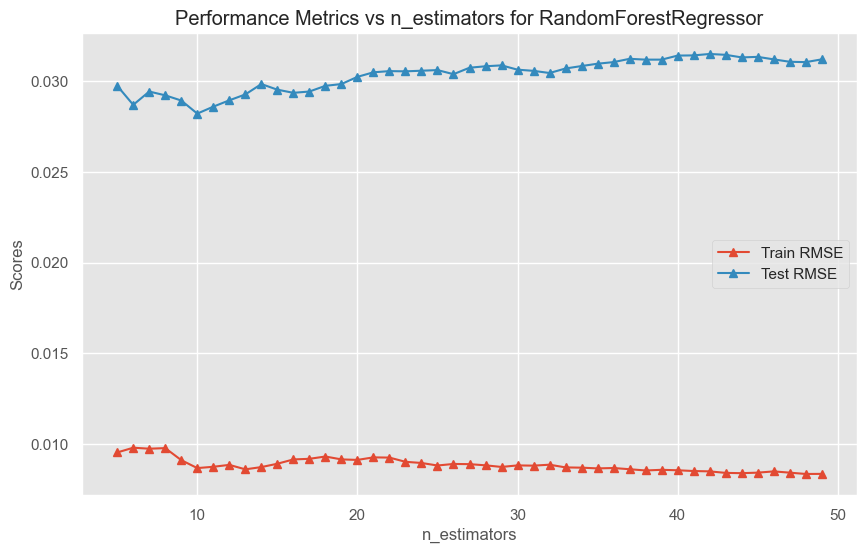

In [168]:
plt.figure(figsize=(10, 6))

plt.plot(n_estimators_list, rd_train_rmse_scores, label='Train RMSE', marker='^')
plt.plot(n_estimators_list, rd_test_rmse_scores, label='Test RMSE', marker='^')

plt.title('Performance Metrics vs n_estimators for RandomForestRegressor')
plt.xlabel('n_estimators')
plt.ylabel('Scores')
plt.legend()
plt.grid(True)
plt.show()


In [170]:
best_r2_train_index = np.argmax(rd_train_r2_scores)
best_r2_test_index = np.argmax(rd_test_r2_scores)

best_mae_train_index = np.argmin(rd_train_mae_scores)
best_mae_test_index = np.argmin(rd_test_mae_scores)

best_mse_train_index = np.argmin(rd_train_mse_scores)
best_mse_test_index = np.argmin(rd_test_mse_scores)

best_rmse_train_index = np.argmin(rd_train_rmse_scores)
best_rmse_test_index = np.argmin(rd_test_rmse_scores)

best_r2_train_estimators = n_estimators_list[best_r2_train_index]
best_r2_test_estimators = n_estimators_list[best_r2_test_index]

best_mae_train_estimators = n_estimators_list[best_mae_train_index]
best_mae_test_estimators = n_estimators_list[best_mae_test_index]

best_mse_train_estimators = n_estimators_list[best_mse_train_index]
best_mse_test_estimators = n_estimators_list[best_mse_test_index]

best_rmse_train_estimators = n_estimators_list[best_rmse_train_index]
best_rmse_test_estimators = n_estimators_list[best_rmse_test_index]

print("Best R2 Score - Train:")
print("n_estimators =", best_r2_train_estimators)
print("Train R2 Score =", rd_train_r2_scores[best_r2_train_index])
print("Test R2 Score =", rd_test_r2_scores[best_r2_train_index])
print()

print("Best R2 Score - Test:")
print("n_estimators =", best_r2_test_estimators)
print("Train R2 Score =", rd_train_r2_scores[best_r2_test_index])
print("Test R2 Score =", rd_test_r2_scores[best_r2_test_index])
print()

print("Best MAE - Train:")
print("n_estimators =", best_mae_train_estimators)
print("Train MAE =", rd_train_mae_scores[best_mae_train_index])
print("Test MAE =", rd_test_mae_scores[best_mae_train_index])
print()

print("Best MAE - Test:")
print("n_estimators =", best_mae_test_estimators)
print("Train MAE =", rd_train_mae_scores[best_mae_test_index])
print("Test MAE =", rd_test_mae_scores[best_mae_test_index])
print()

print("Best MSE - Train:")
print("n_estimators =", best_mse_train_estimators)
print("Train MSE =", rd_train_mse_scores[best_mse_train_index])
print("Test MSE =", rd_test_mse_scores[best_mse_train_index])
print()

print("Best MSE - Test:")
print("n_estimators =", best_mse_test_estimators)
print("Train MSE =", rd_train_mse_scores[best_mse_test_index])
print("Test MSE =", rd_test_mse_scores[best_mse_test_index])
print()

print("Best RMSE - Train:")
print("n_estimators =", best_rmse_train_estimators)
print("Train RMSE =", rd_train_rmse_scores[best_rmse_train_index])
print("Test RMSE =", rd_test_rmse_scores[best_rmse_train_index])
print()

print("Best RMSE - Test:")
print("n_estimators =", best_rmse_test_estimators)
print("Train RMSE =", rd_train_rmse_scores[best_rmse_test_index])
print("Test RMSE =", rd_test_rmse_scores[best_rmse_test_index])


Best R2 Score - Train:
n_estimators = 48
Train R2 Score = 0.9997426766085201
Test R2 Score = 0.9964618158714583

Best R2 Score - Test:
n_estimators = 10
Train R2 Score = 0.999722381279232
Test R2 Score = 0.9970781532189004

Best MAE - Train:
n_estimators = 13
Train MAE = 0.0004771178188996247
Test MAE = 0.0018018807312748311

Best MAE - Test:
n_estimators = 6
Train MAE = 0.0005400843881949678
Test MAE = 0.0017400658061339036

Best MSE - Train:
n_estimators = 48
Train MSE = 7.00685654008438e-05
Test MSE = 0.0009630061350501982

Best MSE - Test:
n_estimators = 10
Train MSE = 7.559493670886078e-05
Test MSE = 0.0007952543659832952

Best RMSE - Train:
n_estimators = 48
Train RMSE = 0.008370696828869375
Test RMSE = 0.031032340147823176

Best RMSE - Test:
n_estimators = 10
Train RMSE = 0.008694534875935618
Test RMSE = 0.028200254714865525
